In [1]:
import numpy as np 
import matplotlib.pyplot as plt
from scipy.optimize import *
from copy import copy, deepcopy
import matplotlib as mpl
from parameters import *

from models.game_theory_model.benefit_function import *
from models.game_theory_model.damage_function import *

from models.game import *
from plot_function import *

import seaborn as sns

sns.set_style('ticks',  {"axes.grid" : "True", "grid.color": ".4", "grid.linestyle": ":"})
sns.set_context('paper')

# sns.set_style('darkgrid',  {"axes.grid" : "True", "grid.color": ".6", "grid.linestyle": ":"})
# sns.set_context("talk")
# plt.rcParams.update({
#     # "text.usetex": True,
#     "font.family": "sans-serif",
#     "font.sans-serif": ["Helvetica"],
#     "figure.titlesize": 16})
plt.rcParams.update({'mathtext.default':  'regular' })
plt.rcParams['xtick.direction'] = 'out'
# sns.axes_style( { 'xtick.color': 'black',
#  'ytick.color': 'black',
#  'xtick.bottom': True,
#  'xtick.top': True,
#  'ytick.left': True,
#  'ytick.right': True})
# # mpl.rc('text', usetex=True)
# mpl.rc('ytick'  , labelsize=15)
# mpl.rc('xtick'  , labelsize=13)

# mpl.rc('legend' , fontsize= 18)
# mpl.rc('axes'   , labelsize=15,  titlesize=16) 
# plt.rcParams['font.size'] = '16'




In [2]:
figsize=(7,4.5)

In [3]:
figsize

(7, 4.5)

In [4]:
sns.plotting_context()

{'font.size': 9.600000000000001,
 'axes.labelsize': 9.600000000000001,
 'axes.titlesize': 9.600000000000001,
 'xtick.labelsize': 8.8,
 'ytick.labelsize': 8.8,
 'legend.fontsize': 8.8,
 'axes.linewidth': 1.0,
 'grid.linewidth': 0.8,
 'lines.linewidth': 1.2000000000000002,
 'lines.markersize': 4.800000000000001,
 'patch.linewidth': 0.8,
 'xtick.major.width': 1.0,
 'ytick.major.width': 1.0,
 'xtick.minor.width': 0.8,
 'ytick.minor.width': 0.8,
 'xtick.major.size': 4.800000000000001,
 'ytick.major.size': 4.800000000000001,
 'xtick.minor.size': 3.2,
 'ytick.minor.size': 3.2,
 'legend.title_fontsize': 9.600000000000001}

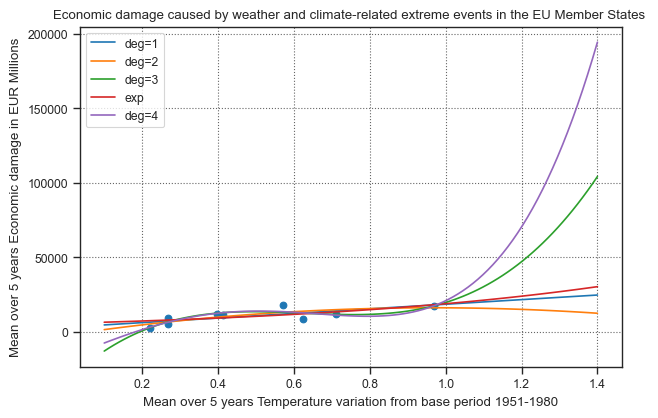

In [5]:
import pandas as pd


data = pd.read_csv('data/natural-disasters-events-5.csv')
data_temp = pd.read_csv('data/temperature_NASA_2022.csv')

data_temp = data_temp[data_temp['Year'] >=1980]
data_temp = data_temp[data_temp['Year'] <=2020]


z = data_temp['MAM'].to_numpy()

y = data['Hydrological events:number'].to_numpy() + data['Climatological events:number'].to_numpy() + data['Meteorological events:number'].to_numpy()

x = np.linspace(0.1,1.4,100)

z_5y = np.array([np.sum(z[t:t+5])/5 for t in range(0,len(y),5)])
y_5y = np.array([np.sum(y[t:t+5])/5 for t in range(0,len(y),5)])

inds = np.argsort(z_5y)
z_5y = np.sort(z_5y)
y_5y = y_5y[inds]

from scipy.optimize import curve_fit

[a, b], res1 = curve_fit(lambda x1,a,b: a*np.exp(b*x1),  z_5y,  y_5y)

y1 = a * np.exp(b * x)

 
poly_1 = np.polyfit(z_5y, y_5y, 1)
poly_2 = np.polyfit(z_5y, y_5y, 2)
poly_3 = np.polyfit(z_5y, y_5y, 3)
poly_4 = np.polyfit(z_5y, y_5y, 4)
plt.figure(figsize=figsize, dpi=100)
plt.scatter(z_5y,y_5y)
plt.plot(x, np.polyval(poly_1,x), label= 'deg=1')
plt.plot(x, np.polyval(poly_2,x), label= 'deg=2')
plt.plot(x, np.polyval(poly_3,x), label= 'deg=3')
plt.plot(x, y1, label='exp')
plt.plot(x, np.polyval(poly_4,x), label= 'deg=4')
# plt.yscale('log')
plt.ylabel("Mean over 5 years Economic damage in EUR Millions")
plt.xlabel('Mean over 5 years Temperature variation from base period 1951-1980')
plt.title('Economic damage caused by weather and climate-related extreme events in the EU Member States ')
plt.legend()
plt.show()

In [6]:
import pandas as pd

data = pd.read_csv('data/rcp_data.csv')
RCP_26 = data.loc[data['Scenario'] == 'RCP-2.6'].to_numpy()[0][8:] * 44/12
RCP_85 = data.loc[data['Scenario'] == 'RCP-8.5'].to_numpy()[0][8:] * 44/12
RCP_60 = data.loc[data['Scenario'] == 'RCP-6.0'].to_numpy()[0][8:] * 44/12

RCP_26

array([37.62, 33.37785, 29.13533333333333, 23.777416666666667,
       18.421333333333333, 15.41925, 12.418999999999999,
       9.938866666666666, 7.461666666666667, 4.92855, 2.398,
       1.4129500000000002, 0.42900000000000005, -0.2770166666666667,
       -0.9826666666666668, -1.2606, -1.54], dtype=object)

C:\Users\Anthony Couthures\AppData\Local\Temp\ipykernel_17380\413860895.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels([f'{x/100:.0%}' for x in plt.gca().get_yticks()])


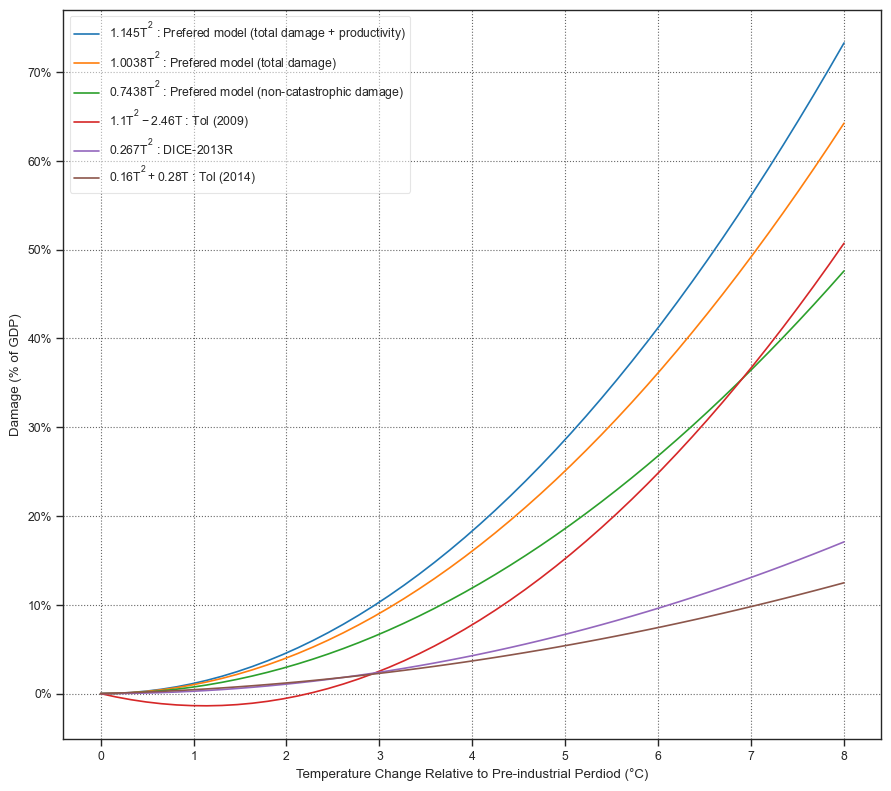

In [7]:
plt.figure(figsize =(9,8),dpi=100, tight_layout=True)
x = np.linspace(0,8, 50)
plt.plot(x, np.polyval(np.flip([0,0,1.1450]),x), label = '${} T^2$ : Prefered model (total damage + productivity)'.format(1.1450))
plt.plot(x, np.polyval(np.flip([0,0,1.0038]),x), label = '${} T^2$ : Prefered model (total damage) '.format(1.0038))
plt.plot(x, np.polyval(np.flip([0,0,0.7438]),x), label = '${} T^2$ : Prefered model (non-catastrophic damage)'.format(0.7438))
plt.plot(x, np.polyval(np.flip([0,-2.46,1.1]),x), label = '${} T^2 - {}T$ : Tol (2009)'.format(1.1, 2.46))
plt.plot(x, np.polyval(np.flip([0,0,0.267]),x), label = '${} T^2$ : DICE-2013R'.format(0.267))
plt.plot(x, np.polyval(np.flip([0,0.28,0.16]),x), label = '${} T^2 + {}T$ : Tol (2014)'.format(0.16, 0.28))
plt.xlabel('Temperature Change Relative to Pre-industrial Perdiod (°C)')
plt.ylabel(r'Damage (% of GDP)')
plt.gca().set_yticklabels([f'{x/100:.0%}' for x in plt.gca().get_yticks()]) 
plt.legend(fancybox=True, framealpha=0.5)
plt.savefig(format='pdf', fname ='multiplicative_damage.pdf')
plt.show()

Utilities


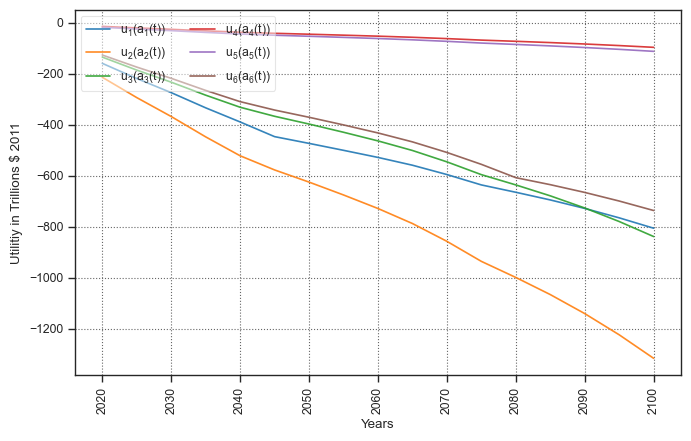

Nash equilibrium action profile


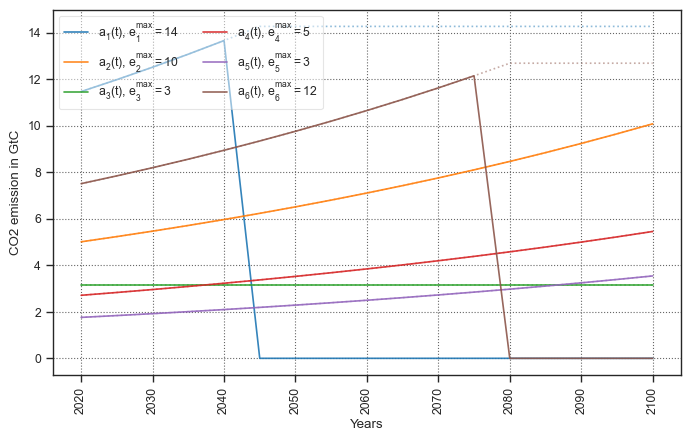

Utilities


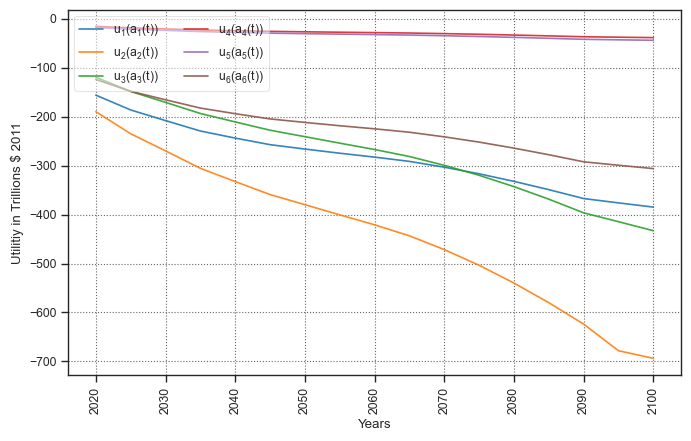

Social Optimum action profile


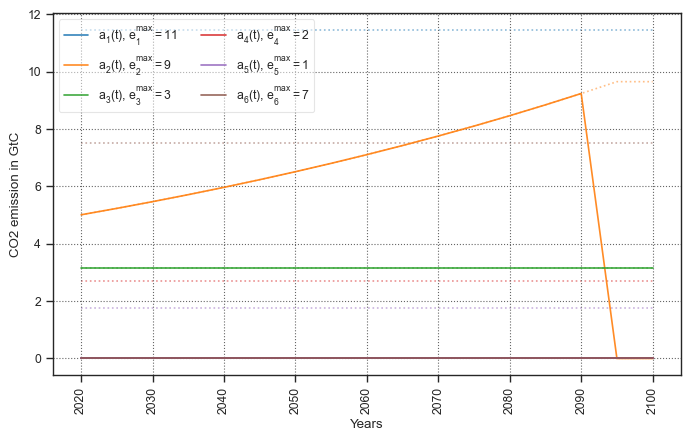

Temperatures


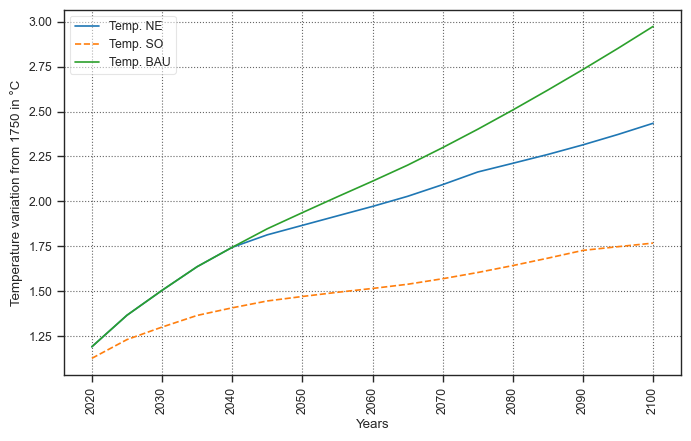

All action profiles


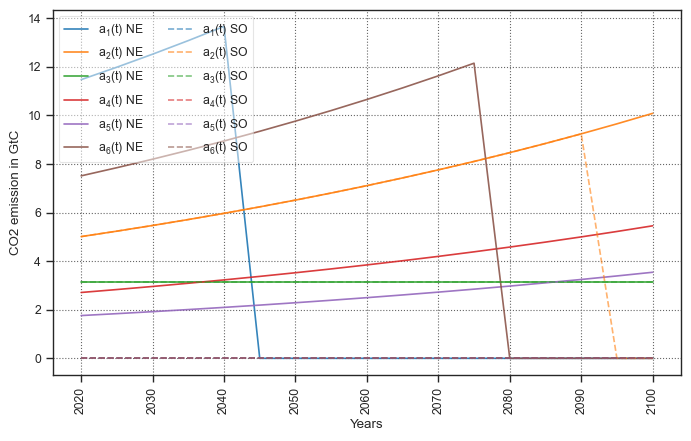

All utilities profiles


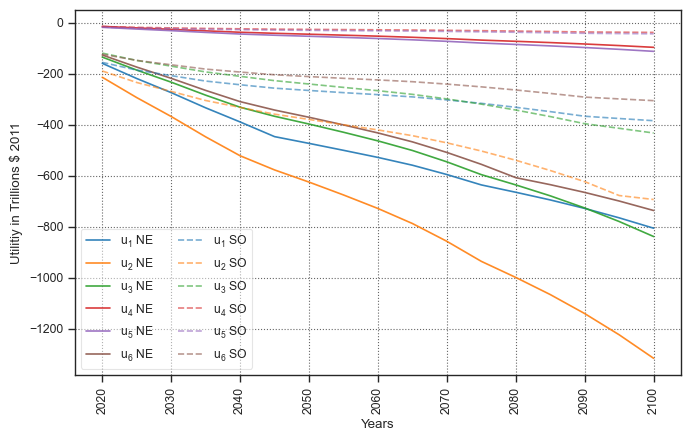

In [8]:
# puissance de la fonction damage 

alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,0,600])

# Création des joueurs 

list_players = create_players(list_benefit_functions=BENEFITS_CONVEX, damage_function=damage_polynome(damage_coef))
# Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

game = Game(list_players)

# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage

plot_Game(game, plot_nash=True, plot_SO=True,  plot_bau = True ,figsize=figsize, name='quadratic_convex', sav=True)


Utilities


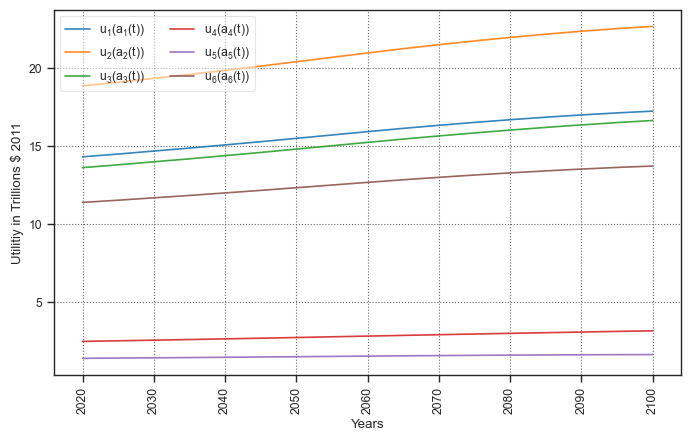

Nash equilibrium action profile


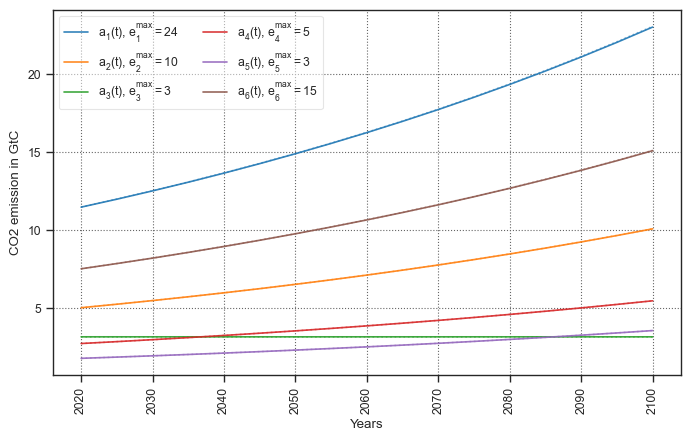

Utilities


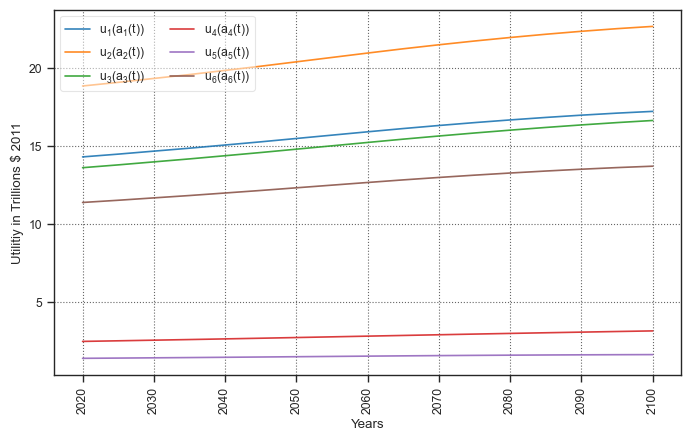

Social Optimum action profile


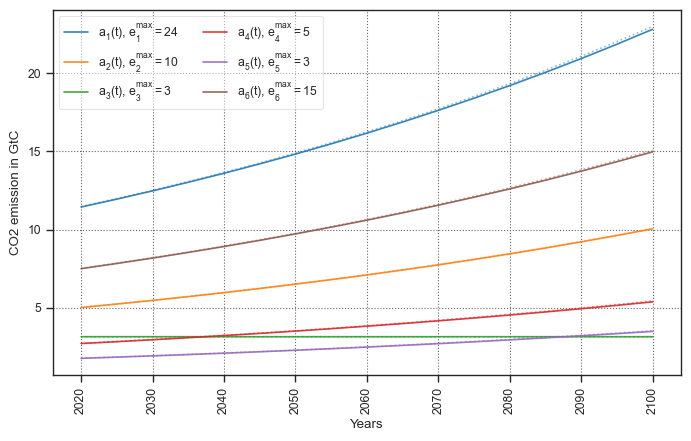

Temperatures


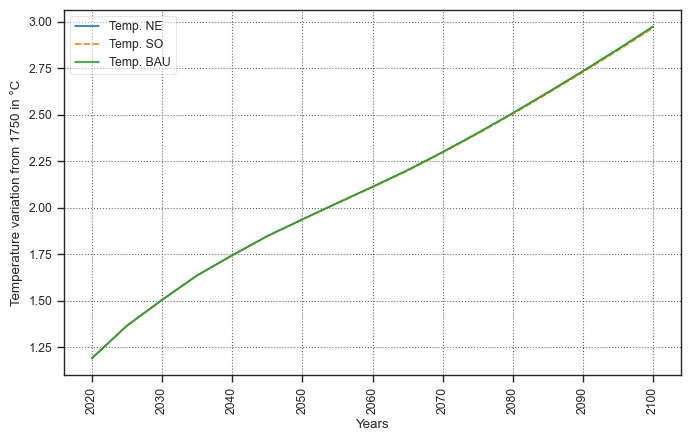

All action profiles


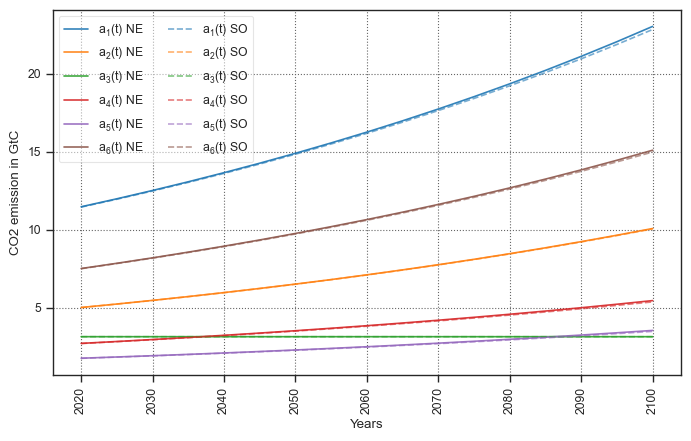

All utilities profiles


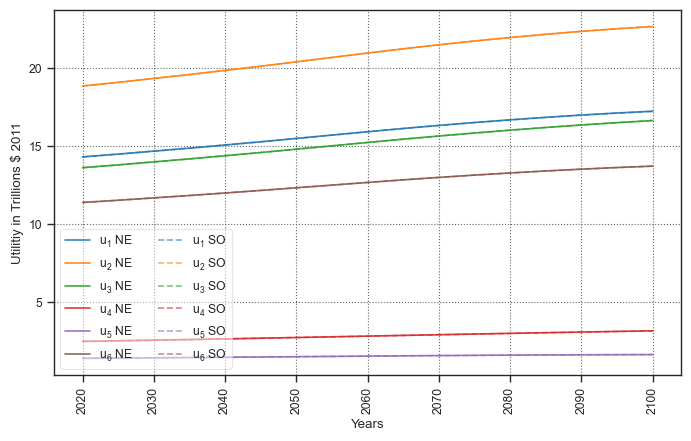

In [9]:
# puissance de la fonction damage 

alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,0,1.145])

# Création des joueurs 

list_players = create_players(list_benefit_functions=BENEFITS_CONCAVE, damage_function=damage_polynome(damage_coef))

# Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

game = Game(list_players)

# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage

plot_Game(game, plot_nash=True, plot_SO=True,  plot_bau = True ,figsize=figsize, name='fig')


Utilities


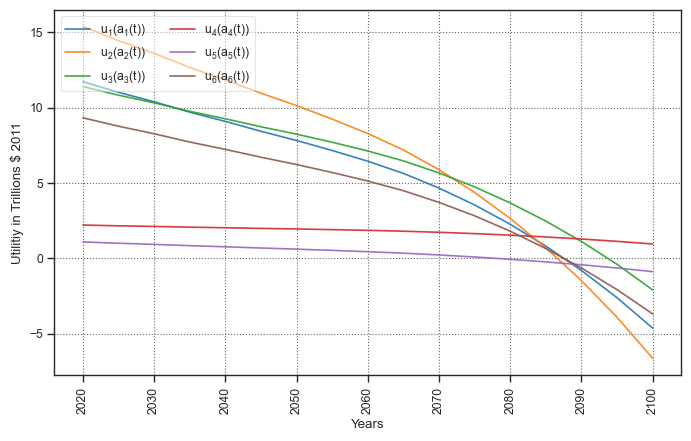

Nash equilibrium action profile


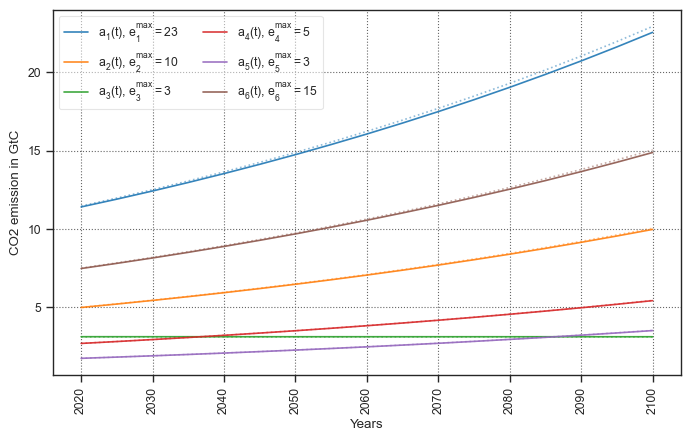

Utilities


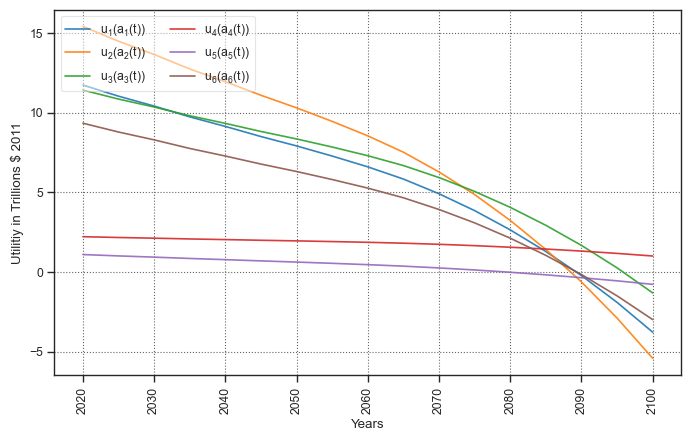

Social Optimum action profile


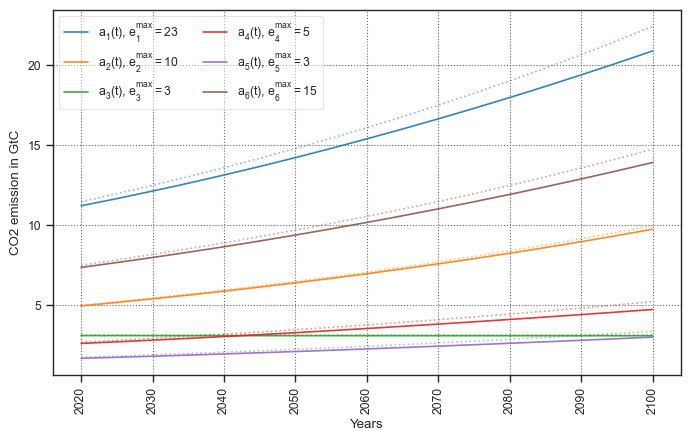

Temperatures


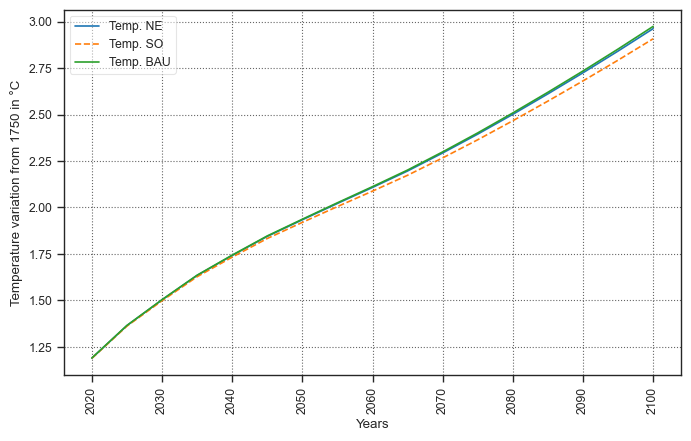

All action profiles


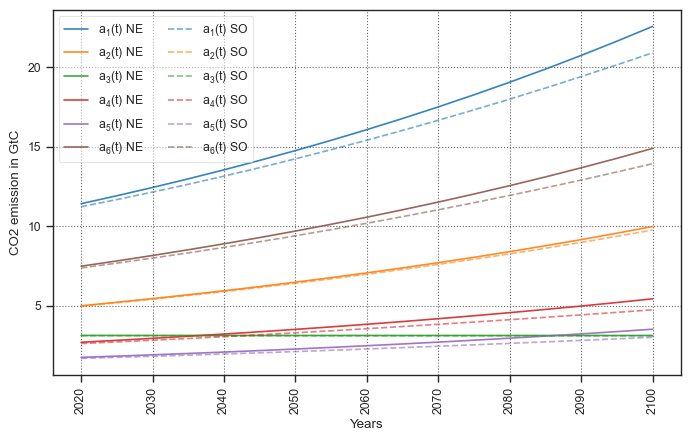

All utilities profiles


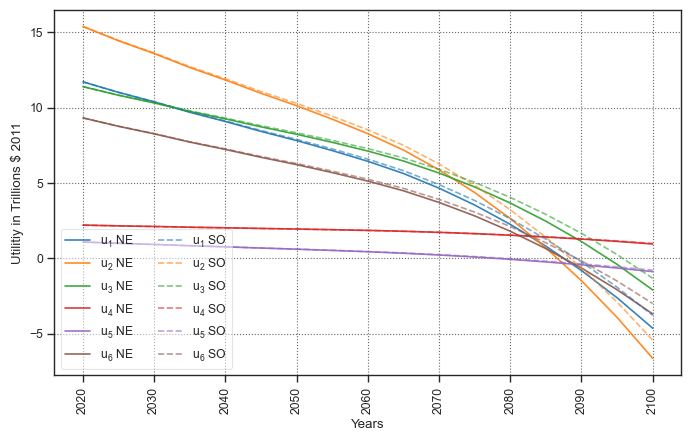

In [10]:
# puissance de la fonction damage 

alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,0,10])

# Création des joueurs 

list_players = create_players(list_benefit_functions=BENEFITS_CONCAVE, damage_function=damage_polynome(damage_coef))



# Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

game = Game(list_players)

# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage

plot_Game(game, plot_nash=True, plot_SO=True,  plot_bau = True ,figsize=figsize, name='quadratic_10', sav=True)


Utilities


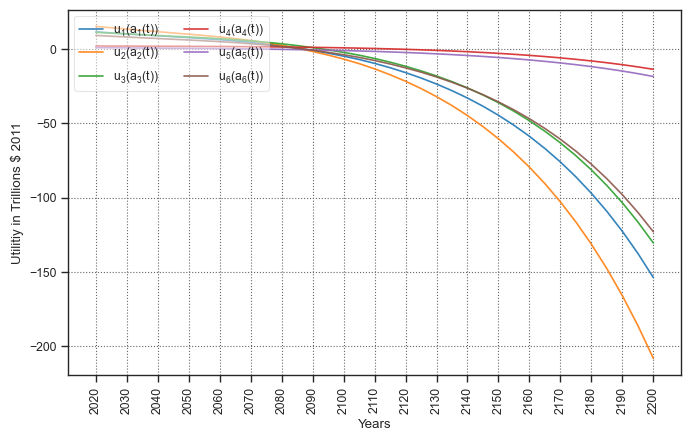

Nash equilibrium action profile


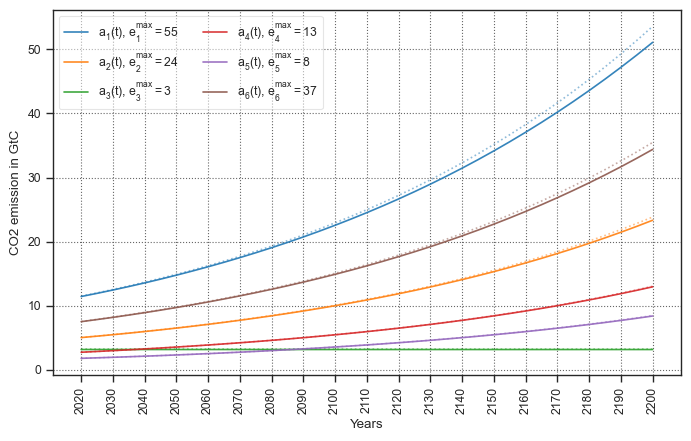

Utilities


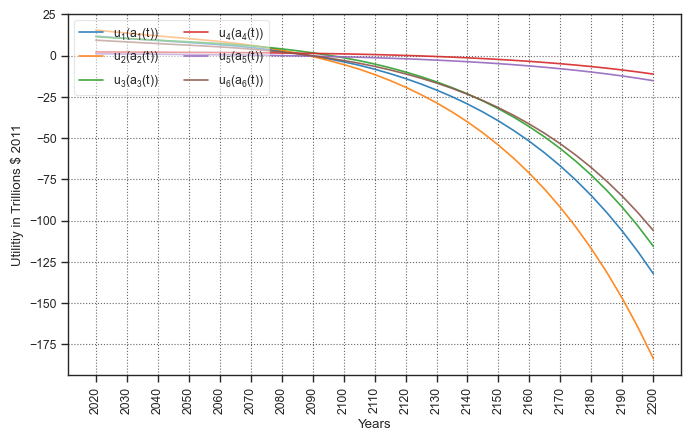

Social Optimum action profile


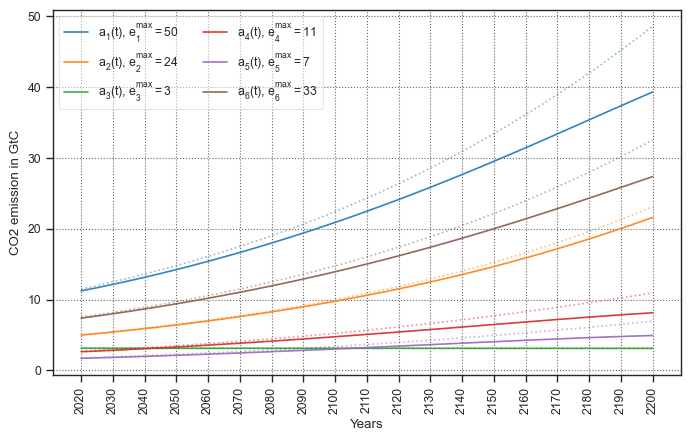

Temperatures


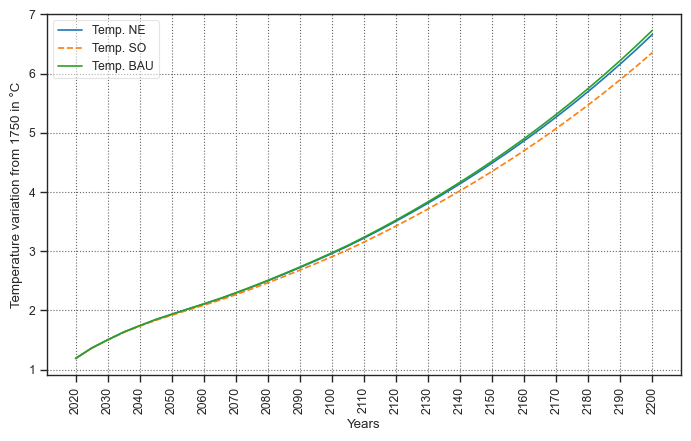

All action profiles


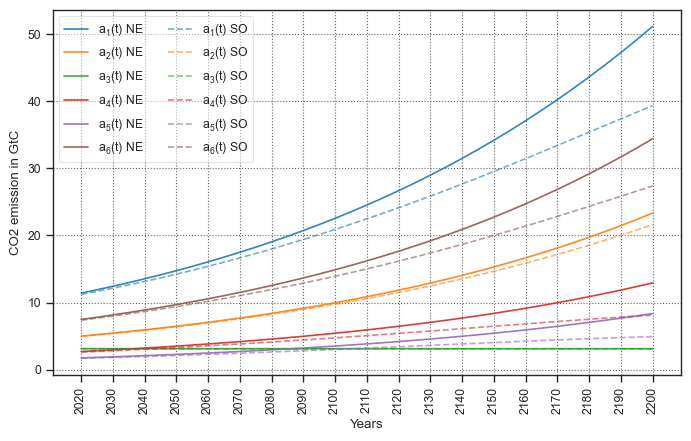

All utilities profiles


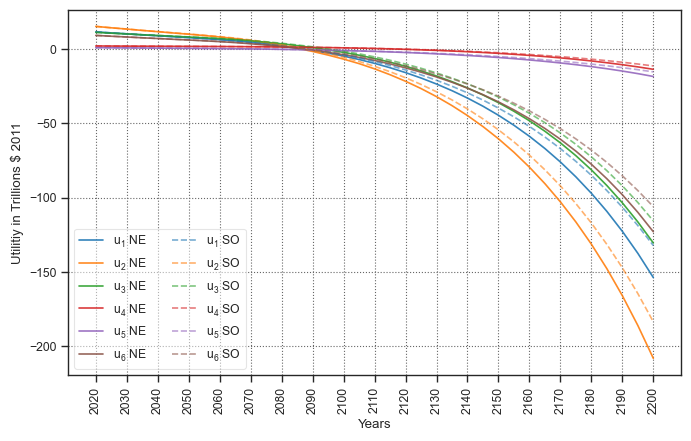

In [12]:
# puissance de la fonction damage 

alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,0,10])

# Création des joueurs 

list_players = create_players(list_benefit_functions=BENEFITS_CONCAVE, damage_function=damage_polynome(damage_coef))



# Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

game = Game(list_players, horizon=2200)


# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage

plot_Game(game, plot_nash=True, plot_SO=True,  plot_bau = True ,figsize=figsize, name='quadratic_10_long', sav=True)


In [12]:
RCP_26

array([37.62, 33.37785, 29.13533333333333, 23.777416666666667,
       18.421333333333333, 15.41925, 12.418999999999999,
       9.938866666666666, 7.461666666666667, 4.92855, 2.398,
       1.4129500000000002, 0.42900000000000005, -0.2770166666666667,
       -0.9826666666666668, -1.2606, -1.54], dtype=object)

In [13]:
temp_RCP26 = []
smc = deepcopy(SCM)
for emission in RCP_26:
    smc.five_years_cycle_deep(emission)
    temp_RCP26.append(smc.atmospheric_temp)

temp_RCP85 = []
smc = deepcopy(SCM)
for emission in RCP_85:
    smc.five_years_cycle_deep(emission)
    temp_RCP85.append(smc.atmospheric_temp)
    
temp_RCP60 = []
smc = deepcopy(SCM)
for emission in RCP_60:
    smc.five_years_cycle_deep(emission)
    temp_RCP60.append(smc.atmospheric_temp)


In [14]:
temp_RCP26

[1.2782266882136457,
 1.429913489669213,
 1.5355323310630506,
 1.6145460604061155,
 1.6744947144489661,
 1.7244210396612827,
 1.7663614214945054,
 1.8021686613255112,
 1.8322259182399736,
 1.8565069145181976,
 1.8750599859238979,
 1.8917955237624369,
 1.907143406186499,
 1.9216885909428814,
 1.9353633720161318,
 1.9491383225401013,
 1.9630217428609522]

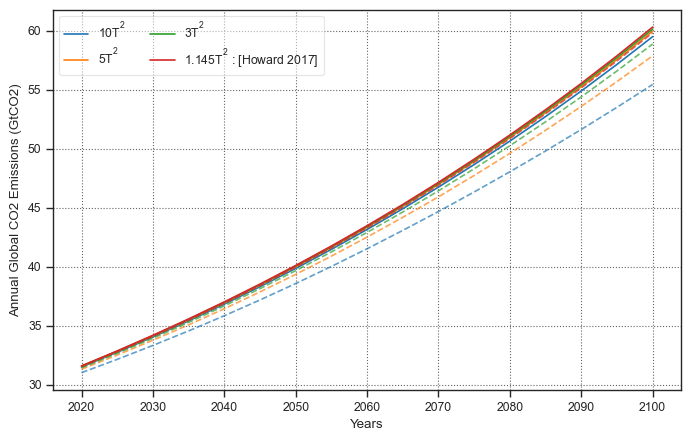

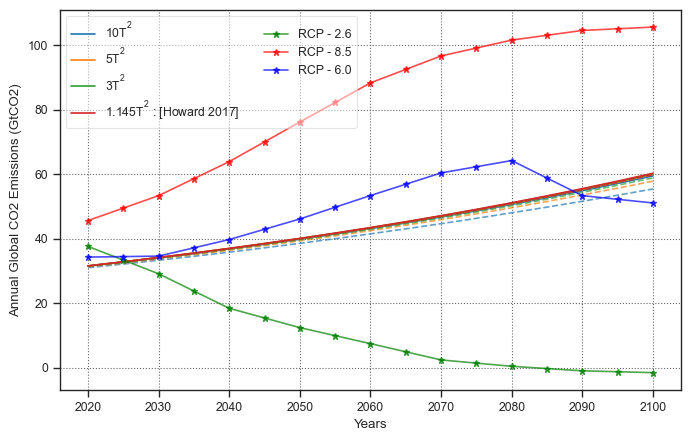

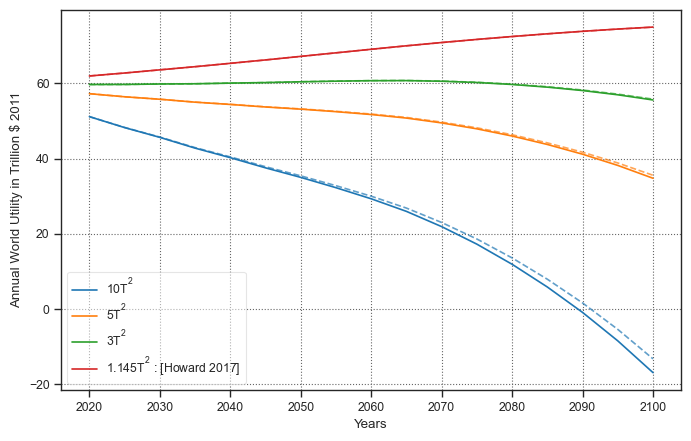

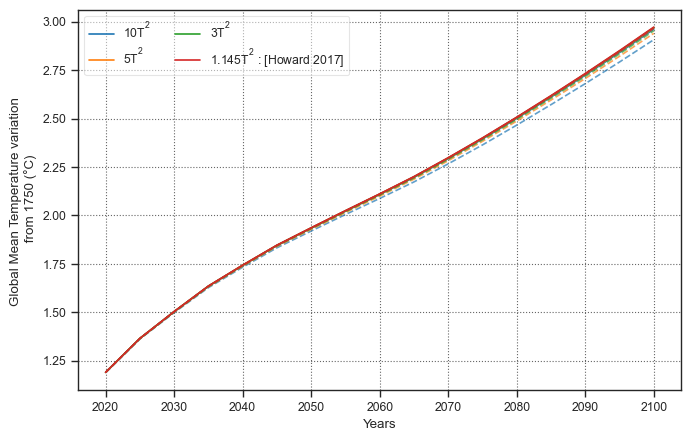

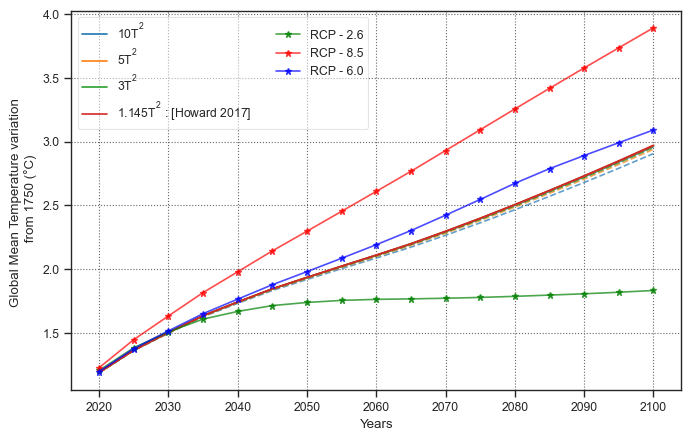

In [15]:
# puissance de la fonction damage 

alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,0,1.145])

list_damage_coef = [np.array([0,0,30]), np.array([0,0,20]), np.array([0,0,10]), np.array([0,0,5]), np.array([0,0,1.1450])]
list_damage_label = ['$30T^2$', '$20T^2$', '$10T^2$', '$5T^2$', '$1.145T^2$ : [Howard 2017]']
list_damage_coef = [np.array([0,0,50]), np.array([0,0,20]), np.array([0,0,10]), np.array([0,0,5]), np.array([0,0,3]), np.array([0,0,1.1450])]
list_damage_label = ['$50T^2$','$20T^2$', '$10T^2$', '$5T^2$','$3T^2$', '$1.145T^2$ : [Howard 2017]']
list_damage_coef = [np.array([0,0,20]), np.array([0,0,10]), np.array([0,0,5]), np.array([0,0,3]), np.array([0,0,1.1450])]
list_damage_label = ['$20T^2$', '$10T^2$', '$5T^2$','$3T^2$', '$1.145T^2$ : [Howard 2017]']
list_damage_coef = [np.array([0,0,10]), np.array([0,0,5]), np.array([0,0,3]), np.array([0,0,1.1450])]
list_damage_label = ['$10T^2$', '$5T^2$','$3T^2$', '$1.145T^2$ : [Howard 2017]']

# list_damage_coef.reverse()
# list_damage_label.reverse()

# Création des joueurs 
list_sum_action = []
list_sum_utilities = []
list_temp = []
list_sum_action_so = []
list_sum_utilities_so = []
list_temp_so = []
for damage_coef in list_damage_coef :
    list_players = create_players(list_benefit_functions=BENEFITS_CONCAVE, damage_function=damage_polynome(damage_coef))


    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game_NE()
    game.repeated_one_shot_game_SO()

    list_sum_action.append(game.ne_sum_a_p)
    list_temp.append(game.ne_temp_p)
    list_sum_utilities.append(game.ne_sum_u_p)
    list_sum_action_so.append(game.so_sum_a_p)
    list_temp_so.append(game.so_temp_p)
    list_sum_utilities_so.append(game.so_sum_u_p)


plt.figure(figsize=figsize, dpi=100, tight_layout=True)


for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_sum_action[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_sum_action_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)

plt.ylabel('Annual Global CO2 Emissions (GtCO2)')
plt.xlabel('Years')
plt.legend(ncol= 2,loc='upper left',fancybox=True, framealpha=0.5)
plt.savefig(fname="Annual_Global_CO2_Emission_concave.pdf", format='pdf')
plt.show()

plt.figure(figsize=figsize, dpi=100, tight_layout=True)


for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_sum_action[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_sum_action_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)

plt.plot(2020 + np.arange(game.T)*5, RCP_26, label="RCP - 2.6", marker="*", color='green', alpha = 0.7)
plt.plot(2020 + np.arange(game.T)*5, RCP_85, label="RCP - 8.5",marker="*", color='red', alpha = 0.7)
plt.plot(2020 + np.arange(game.T)*5, RCP_60, label="RCP - 6.0",marker="*", color='blue', alpha = 0.7)

plt.ylabel('Annual Global CO2 Emissions (GtCO2)')
plt.xlabel('Years')
plt.legend(ncol= 2,loc='upper left',fancybox=True, framealpha=0.5)
plt.savefig(fname="Annual_Global_CO2_Emission_concave_RCP.pdf", format='pdf')
plt.show()

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_sum_utilities[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_sum_utilities_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)

plt.ylabel('Annual World Utility in Trillion $ 2011')
plt.xlabel('Years')
plt.legend(fancybox=True, framealpha=0.5)
plt.savefig(fname="Annual_World_Utility_concave.pdf", format='pdf')

plt.show()

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_temp[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_temp_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)

plt.ylabel('Global Mean Temperature variation \n from 1750 (°C)')
plt.xlabel('Years')

plt.legend(ncol= 2,loc='upper left',fancybox=True, framealpha=0.5)
plt.savefig(fname="Global_Mean_Temperature_concave.pdf", format='pdf')

plt.show()


plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_temp[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_temp_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)


plt.plot(2020 + np.arange(game.T)*5, temp_RCP26, label="RCP - 2.6", marker="*", color='green', alpha = 0.7)
plt.plot(2020 + np.arange(game.T)*5, temp_RCP85, label="RCP - 8.5",marker="*", color='red', alpha = 0.7)
plt.plot(2020 + np.arange(game.T)*5, temp_RCP60, label="RCP - 6.0",marker="*", color='blue', alpha = 0.7)

plt.ylabel('Global Mean Temperature variation \n from 1750 (°C)')
plt.xlabel('Years')

plt.legend(ncol= 2,loc='upper left',fancybox=True, framealpha=0.5)
plt.savefig(fname="Global_Mean_Temperature_concave_RCP.pdf", format='pdf')

plt.show()
# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage



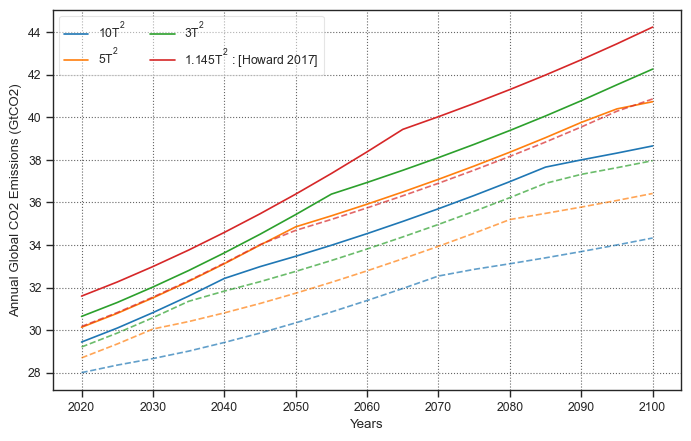

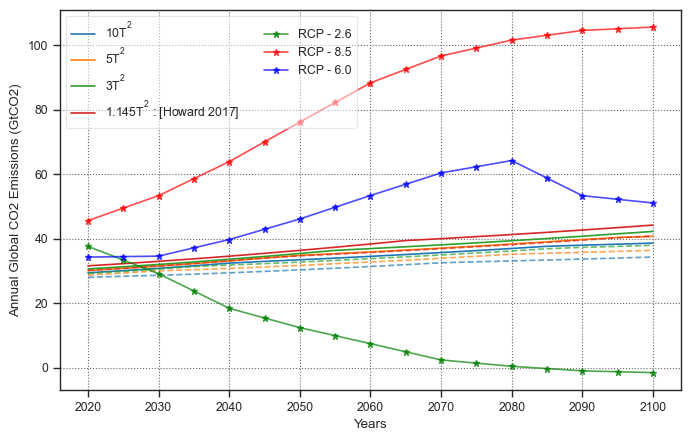

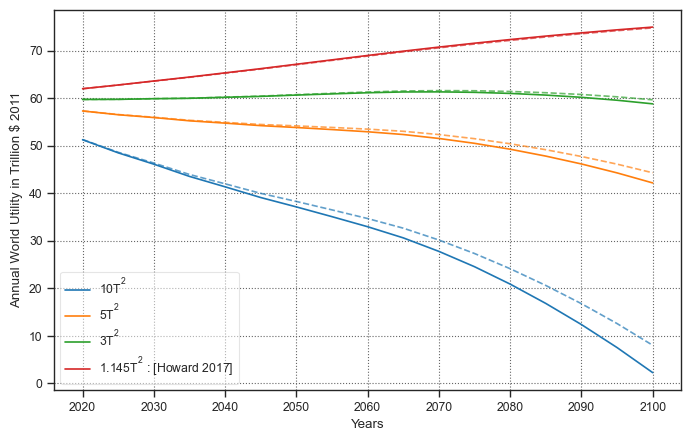

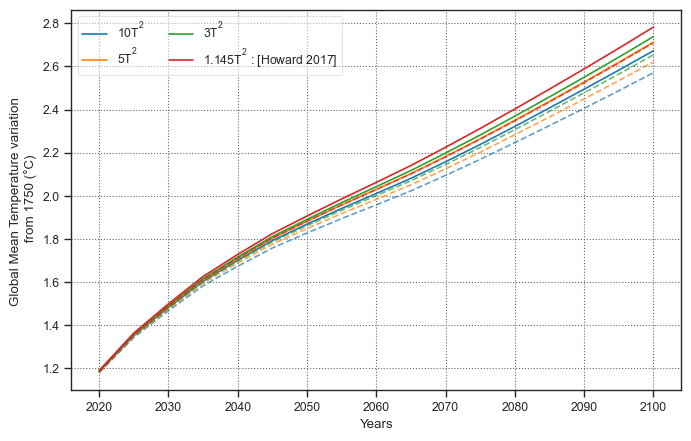

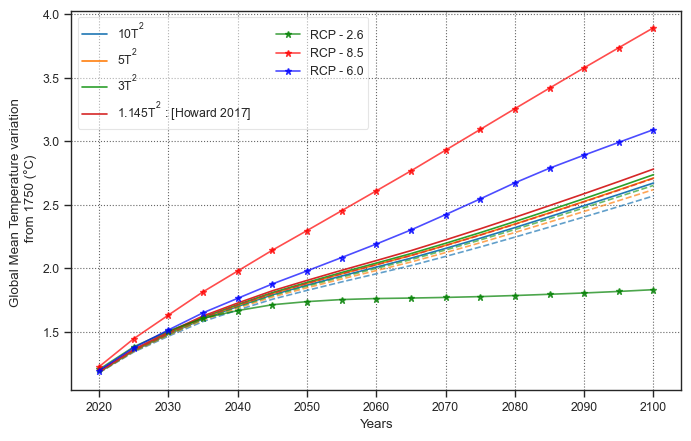

In [17]:
# puissance de la fonction damage 

alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,0,1.145])

list_damage_coef = [np.array([0,0,30]), np.array([0,0,20]), np.array([0,0,10]), np.array([0,0,5]), np.array([0,0,1.1450])]
list_damage_label = ['$30T^2$', '$20T^2$', '$10T^2$', '$5T^2$', '$1.145T^2$ : [Howard 2017]']
list_damage_coef = [np.array([0,0,50]), np.array([0,0,20]), np.array([0,0,10]), np.array([0,0,5]), np.array([0,0,3]), np.array([0,0,1.1450])]
list_damage_label = ['$50T^2$','$20T^2$', '$10T^2$', '$5T^2$','$3T^2$', '$1.145T^2$ : [Howard 2017]']
list_damage_coef = [np.array([0,0,20]), np.array([0,0,10]), np.array([0,0,5]), np.array([0,0,3]), np.array([0,0,1.1450])]
list_damage_label = ['$20T^2$', '$10T^2$', '$5T^2$','$3T^2$', '$1.145T^2$ : [Howard 2017]']
list_damage_coef = [np.array([0,0,10]), np.array([0,0,5]), np.array([0,0,3]), np.array([0,0,1.1450])]
list_damage_label = ['$10T^2$', '$5T^2$','$3T^2$', '$1.145T^2$ : [Howard 2017]']

# list_damage_coef.reverse()
# list_damage_label.reverse()

# Création des joueurs 
list_sum_action = []
list_sum_utilities = []
list_temp = []
list_sum_action_so = []
list_sum_utilities_so = []
list_temp_so = []
for damage_coef in list_damage_coef :
    list_players = create_players(list_benefit_functions=BENEFITS_SIGMOID, damage_function=damage_polynome(damage_coef))


    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game_NE()
    game.repeated_one_shot_game_SO()

    list_sum_action.append(game.ne_sum_a_p)
    list_temp.append(game.ne_temp_p)
    list_sum_utilities.append(game.ne_sum_u_p)
    list_sum_action_so.append(game.so_sum_a_p)
    list_temp_so.append(game.so_temp_p)
    list_sum_utilities_so.append(game.so_sum_u_p)


plt.figure(figsize=figsize, dpi=100, tight_layout=True)


for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_sum_action[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_sum_action_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)

plt.ylabel('Annual Global CO2 Emissions (GtCO2)')
plt.xlabel('Years')
plt.legend(ncol= 2,loc='upper left',fancybox=True, framealpha=0.5)
plt.savefig(fname="Annual_Global_CO2_Emission_sigmoid.pdf", format='pdf')
plt.show()

plt.figure(figsize=figsize, dpi=100, tight_layout=True)


for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_sum_action[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_sum_action_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)

plt.plot(2020 + np.arange(game.T)*5, RCP_26, label="RCP - 2.6", marker="*", color='green', alpha = 0.7)
plt.plot(2020 + np.arange(game.T)*5, RCP_85, label="RCP - 8.5",marker="*", color='red', alpha = 0.7)
plt.plot(2020 + np.arange(game.T)*5, RCP_60, label="RCP - 6.0",marker="*", color='blue', alpha = 0.7)

plt.ylabel('Annual Global CO2 Emissions (GtCO2)')
plt.xlabel('Years')
plt.legend(ncol= 2,loc='upper left',fancybox=True, framealpha=0.5)
plt.savefig(fname="Annual_Global_CO2_Emission_sigmoid_RCP.pdf", format='pdf')
plt.show()

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_sum_utilities[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_sum_utilities_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)

plt.ylabel('Annual World Utility in Trillion $ 2011')
plt.xlabel('Years')
plt.legend(fancybox=True, framealpha=0.5)
plt.savefig(fname="Annual_World_Utility_sigmoid.pdf", format='pdf')

plt.show()

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_temp[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_temp_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)

plt.ylabel('Global Mean Temperature variation \n from 1750 (°C)')
plt.xlabel('Years')

plt.legend(ncol= 2,loc='upper left',fancybox=True, framealpha=0.5)
plt.savefig(fname="Global_Mean_Temperature_sigmoid.pdf", format='pdf')

plt.show()


plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_temp[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_temp_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)


plt.plot(2020 + np.arange(game.T)*5, temp_RCP26, label="RCP - 2.6", marker="*", color='green', alpha = 0.7)
plt.plot(2020 + np.arange(game.T)*5, temp_RCP85, label="RCP - 8.5",marker="*", color='red', alpha = 0.7)
plt.plot(2020 + np.arange(game.T)*5, temp_RCP60, label="RCP - 6.0",marker="*", color='blue', alpha = 0.7)

plt.ylabel('Global Mean Temperature variation \n from 1750 (°C)')
plt.xlabel('Years')

plt.legend(ncol= 2,loc='upper left',fancybox=True, framealpha=0.5)
plt.savefig(fname="Global_Mean_Temperature_sigmoid_RCP.pdf", format='pdf')

plt.show()
# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage



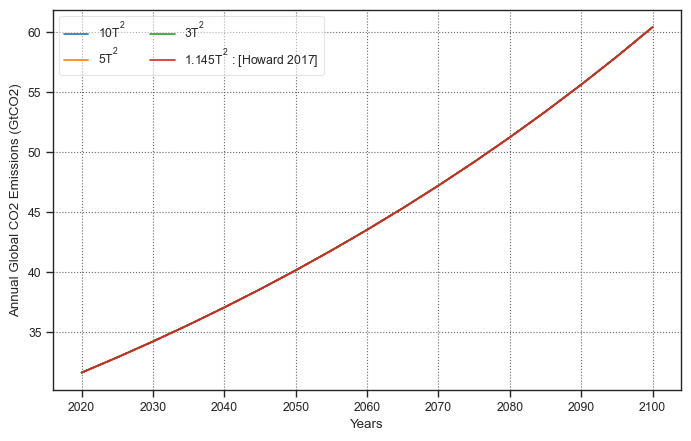

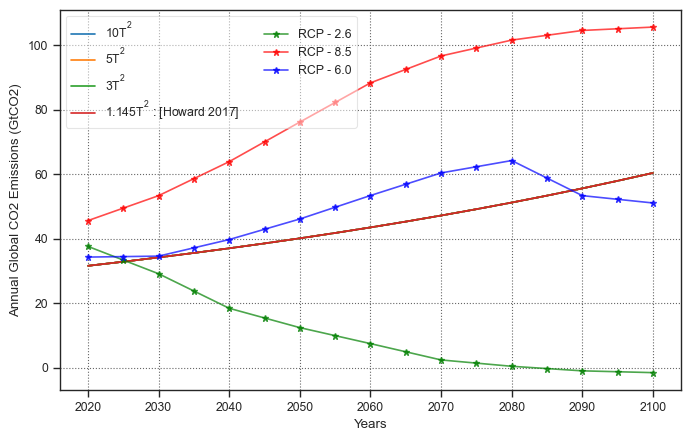

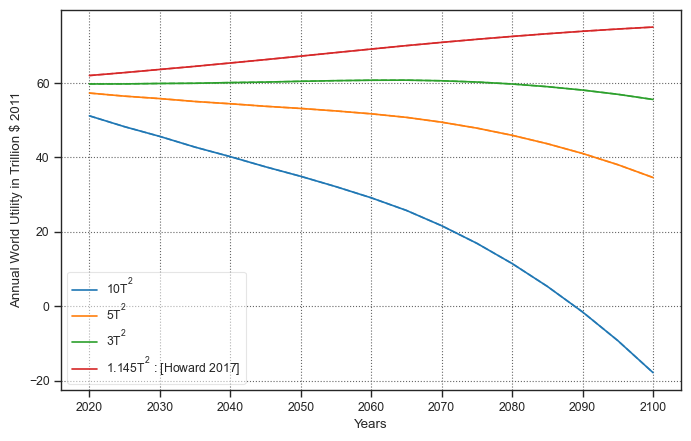

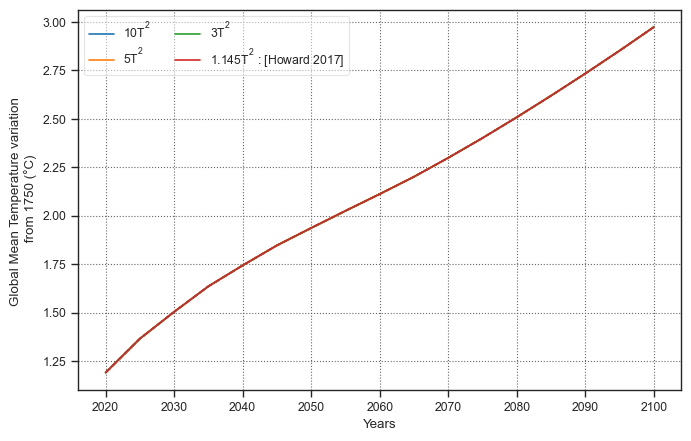

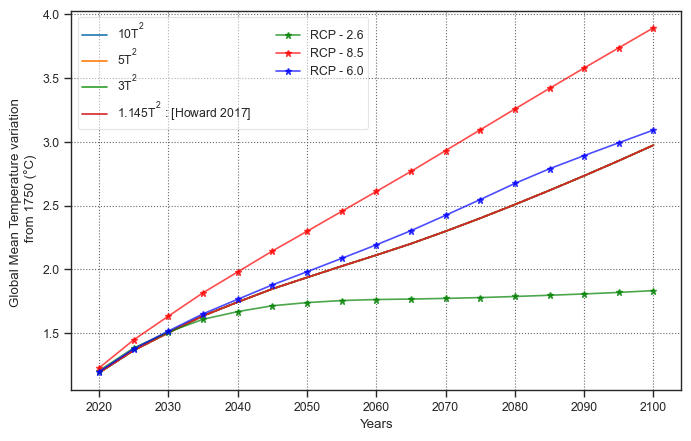

In [18]:
# puissance de la fonction damage 

alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,0,1.145])

list_damage_coef = [np.array([0,0,30]), np.array([0,0,20]), np.array([0,0,10]), np.array([0,0,5]), np.array([0,0,1.1450])]
list_damage_label = ['$30T^2$', '$20T^2$', '$10T^2$', '$5T^2$', '$1.145T^2$ : [Howard 2017]']
list_damage_coef = [np.array([0,0,50]), np.array([0,0,20]), np.array([0,0,10]), np.array([0,0,5]), np.array([0,0,3]), np.array([0,0,1.1450])]
list_damage_label = ['$50T^2$','$20T^2$', '$10T^2$', '$5T^2$','$3T^2$', '$1.145T^2$ : [Howard 2017]']
list_damage_coef = [np.array([0,0,20]), np.array([0,0,10]), np.array([0,0,5]), np.array([0,0,3]), np.array([0,0,1.1450])]
list_damage_label = ['$20T^2$', '$10T^2$', '$5T^2$','$3T^2$', '$1.145T^2$ : [Howard 2017]']
list_damage_coef = [np.array([0,0,10]), np.array([0,0,5]), np.array([0,0,3]), np.array([0,0,1.1450])]
list_damage_label = ['$10T^2$', '$5T^2$','$3T^2$', '$1.145T^2$ : [Howard 2017]']

# list_damage_coef.reverse()
# list_damage_label.reverse()

# Création des joueurs 
list_sum_action = []
list_sum_utilities = []
list_temp = []
list_sum_action_so = []
list_sum_utilities_so = []
list_temp_so = []
for damage_coef in list_damage_coef :
    list_players = create_players(list_benefit_functions=BENEFITS_CONVEX, damage_function=damage_polynome(damage_coef))


    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game_NE()
    game.repeated_one_shot_game_SO()

    list_sum_action.append(game.ne_sum_a_p)
    list_temp.append(game.ne_temp_p)
    list_sum_utilities.append(game.ne_sum_u_p)
    list_sum_action_so.append(game.so_sum_a_p)
    list_temp_so.append(game.so_temp_p)
    list_sum_utilities_so.append(game.so_sum_u_p)


plt.figure(figsize=figsize, dpi=100, tight_layout=True)


for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_sum_action[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_sum_action_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)

plt.ylabel('Annual Global CO2 Emissions (GtCO2)')
plt.xlabel('Years')
plt.legend(ncol= 2,loc='upper left',fancybox=True, framealpha=0.5)
plt.savefig(fname="Annual_Global_CO2_Emission_convex.pdf", format='pdf')
plt.show()

plt.figure(figsize=figsize, dpi=100, tight_layout=True)


for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_sum_action[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_sum_action_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)

plt.plot(2020 + np.arange(game.T)*5, RCP_26, label="RCP - 2.6", marker="*", color='green', alpha = 0.7)
plt.plot(2020 + np.arange(game.T)*5, RCP_85, label="RCP - 8.5",marker="*", color='red', alpha = 0.7)
plt.plot(2020 + np.arange(game.T)*5, RCP_60, label="RCP - 6.0",marker="*", color='blue', alpha = 0.7)

plt.ylabel('Annual Global CO2 Emissions (GtCO2)')
plt.xlabel('Years')
plt.legend(ncol= 2,loc='upper left',fancybox=True, framealpha=0.5)
plt.savefig(fname="Annual_Global_CO2_Emission_convex_RCP.pdf", format='pdf')
plt.show()

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_sum_utilities[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_sum_utilities_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)

plt.ylabel('Annual World Utility in Trillion $ 2011')
plt.xlabel('Years')
plt.legend(fancybox=True, framealpha=0.5)
plt.savefig(fname="Annual_World_Utility_convex.pdf", format='pdf')

plt.show()

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_temp[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_temp_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)

plt.ylabel('Global Mean Temperature variation \n from 1750 (°C)')
plt.xlabel('Years')

plt.legend(ncol= 2,loc='upper left',fancybox=True, framealpha=0.5)
plt.savefig(fname="Global_Mean_Temperature_convex.pdf", format='pdf')

plt.show()


plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_temp[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_temp_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)


plt.plot(2020 + np.arange(game.T)*5, temp_RCP26, label="RCP - 2.6", marker="*", color='green', alpha = 0.7)
plt.plot(2020 + np.arange(game.T)*5, temp_RCP85, label="RCP - 8.5",marker="*", color='red', alpha = 0.7)
plt.plot(2020 + np.arange(game.T)*5, temp_RCP60, label="RCP - 6.0",marker="*", color='blue', alpha = 0.7)

plt.ylabel('Global Mean Temperature variation \n from 1750 (°C)')
plt.xlabel('Years')

plt.legend(ncol= 2,loc='upper left',fancybox=True, framealpha=0.5)
plt.savefig(fname="Global_Mean_Temperature_convex_RCP.pdf", format='pdf')

plt.show()
# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage



Utilities


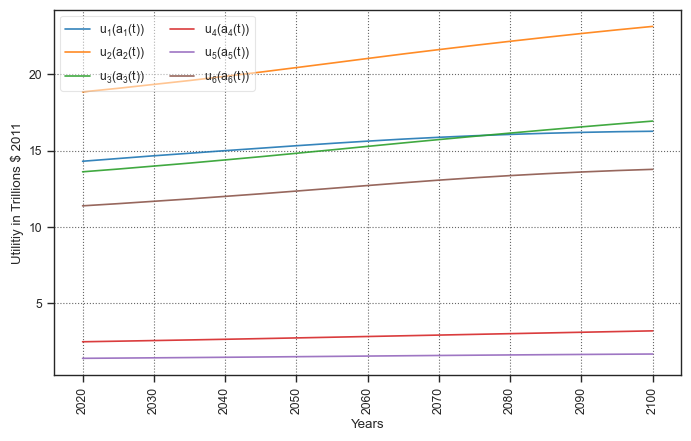

Nash equilibrium action profile


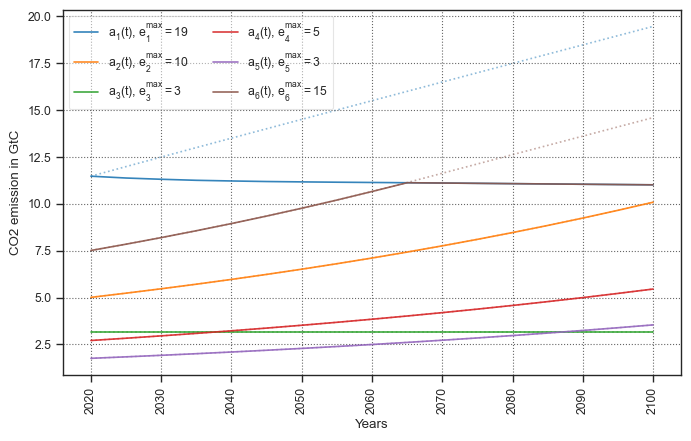

Utilities


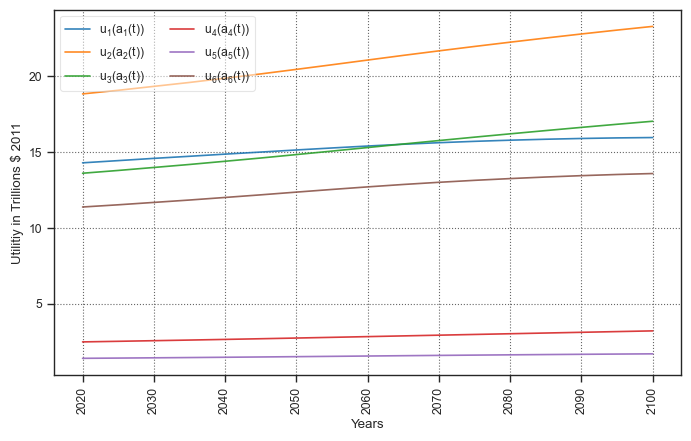

Social Optimum action profile


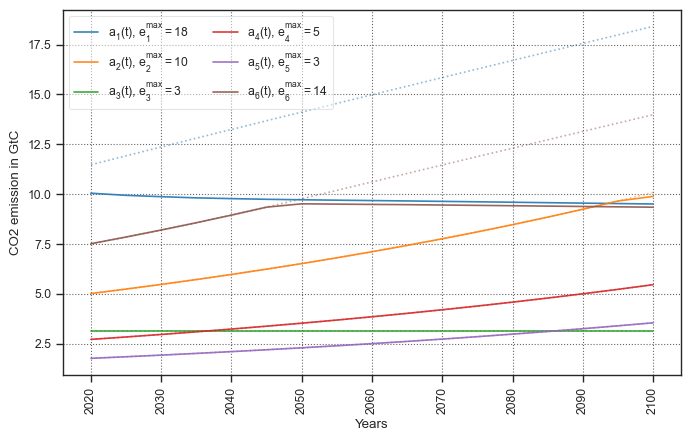

Temperatures


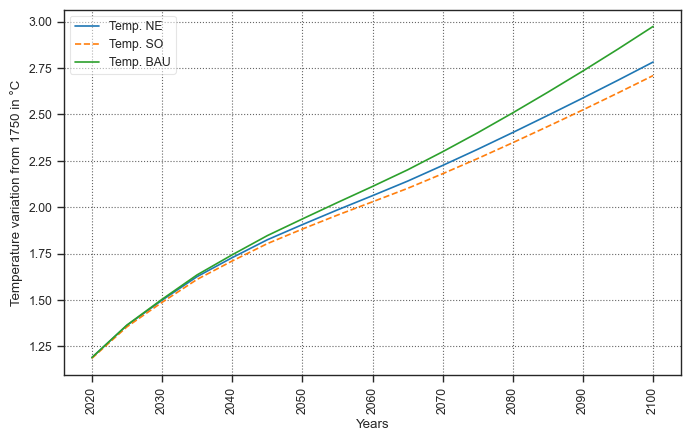

All action profiles


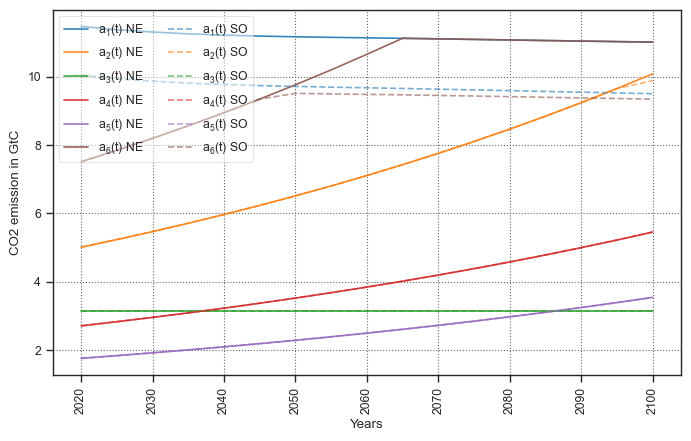

All utilities profiles


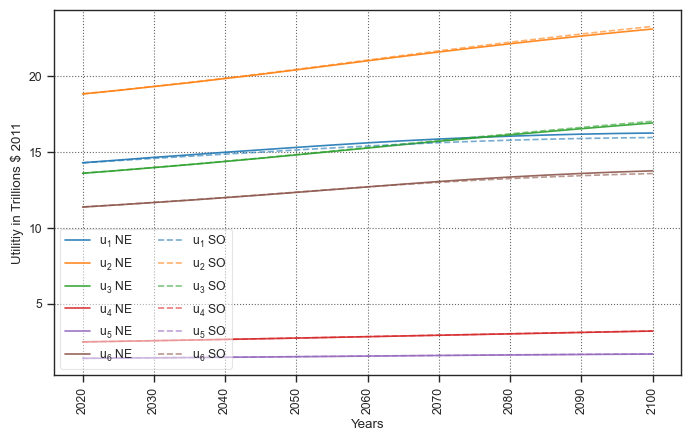

In [19]:
# puissance de la fonction damage 

alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,0,1.145])

# Création des joueurs 

list_players = create_players(list_benefit_functions=BENEFITS_SIGMOID, damage_function=damage_polynome(damage_coef))



# Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

game = Game(list_players)

# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage

plot_Game(game, plot_nash=True, plot_SO=True,  plot_bau = True ,figsize=figsize, name='sigm_1145', sav=True)




In [21]:
indice = 0
u_fct_i = []
x = np.linspace(0,15,500)
plt.figure(figsize = (8,6), dpi = 100)
scm = deepcopy(SCM)
damage = damage_polynome(damage_coef)
benefit = BENEFITS_SIGMOID[indice](GDP_MAX[indice], ACTION_SETS[indice,1])
for u_sum_a in game.ne_sum_a_p :
    ut_ = []

    for x_ in x :
        ut_.append(benefit(x_) - DELTAS[indice] * damage(u_sum_a- ACTION_SETS[indice,1] + x_,scm, GDP_MAX[indice]))
    xmax = x[np.argmax(np.array(ut_))]
    # print(np.argmax(np.array(ut_)))
    ymax = max(ut_)
    plt.scatter( xmax, ymax, s=15)
    plt.plot(x, ut_)
    scm.five_years_cycle_deep(u_sum_a)
    # print(u_sum_a)
    # print(ut_)
    # print(scm.num_cycle)

plt.show()

TypeError: damage() takes 1 positional argument but 3 were given

<Figure size 800x600 with 0 Axes>

In [27]:
print(smc.temperature_model.initial_state)
print(smc.temperature_state)
smc.reset()
print(smc.num_cycle)
smc.five_years_cycle_deep(50)
print(smc.num_cycle)



[1.01   0.0068]
[1.31118709 0.04697116]
0
1


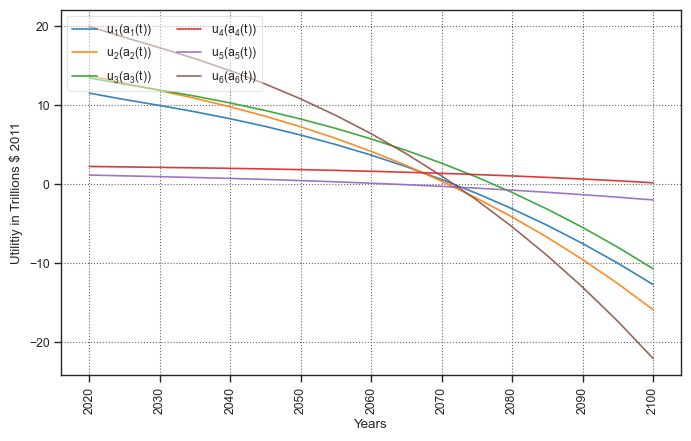

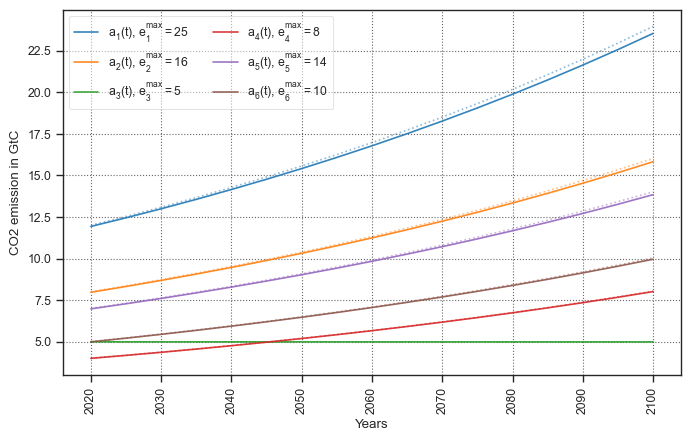

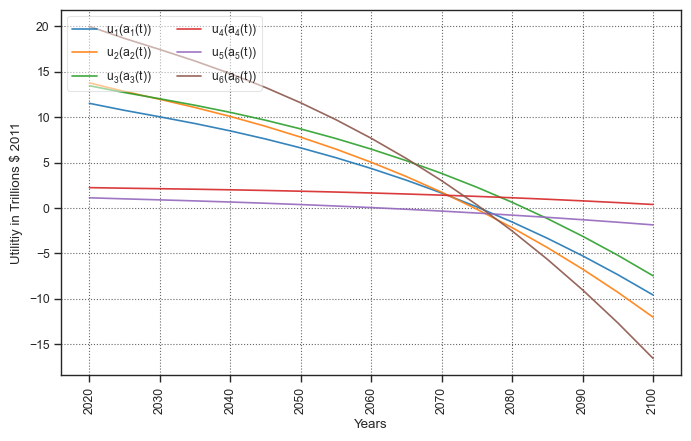

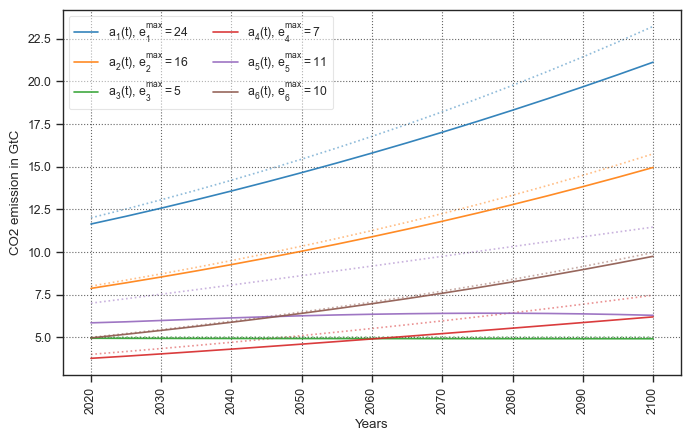

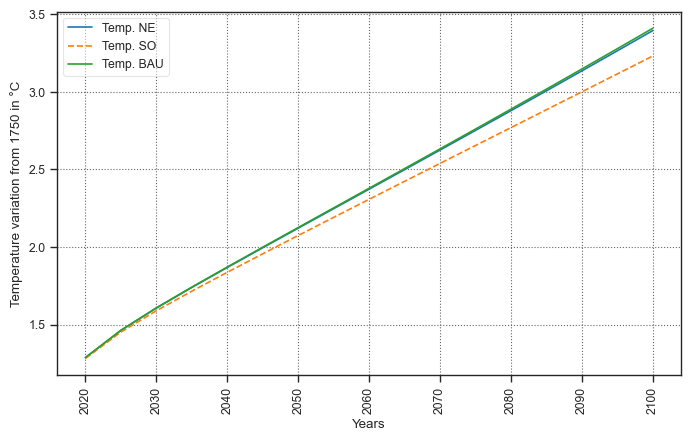

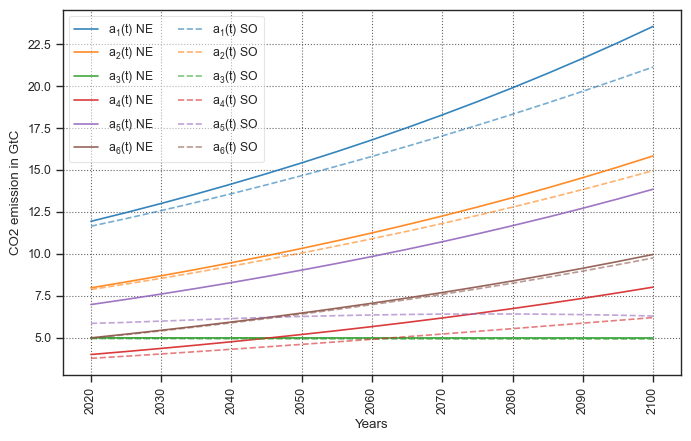

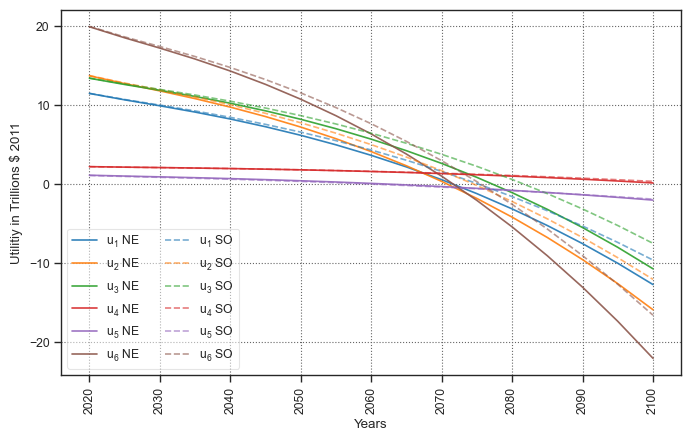

In [ ]:
# puissance de la fonction damage 

alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,0,10])

# Création des joueurs 

list_players = create_players(list_benefit_functions=BENEFITS_CONCAVE, damage_function=damage_polynome_percentage_GDP(damage_coef))



# Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

game = Game(list_players)

# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage

plot_Game(game, plot_nash=True, plot_SO=True,  plot_bau = True ,figsize=figsize, name='quadratic_10', sav=True)


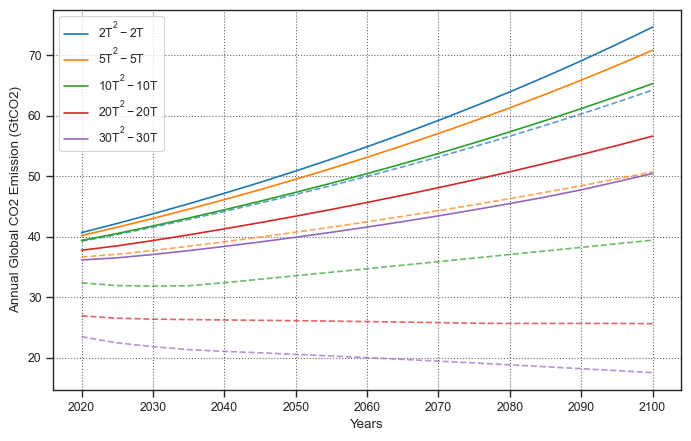

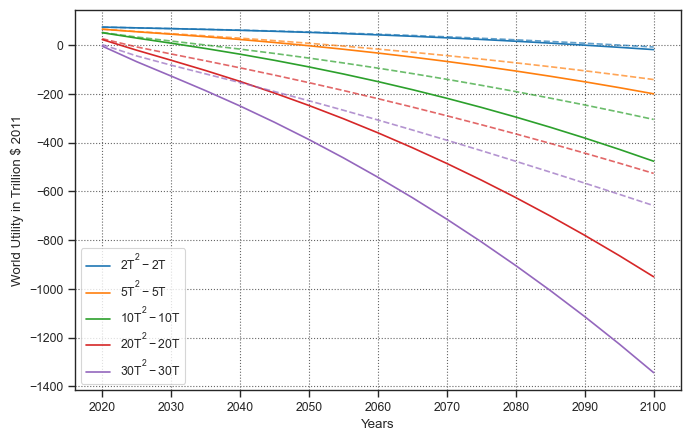

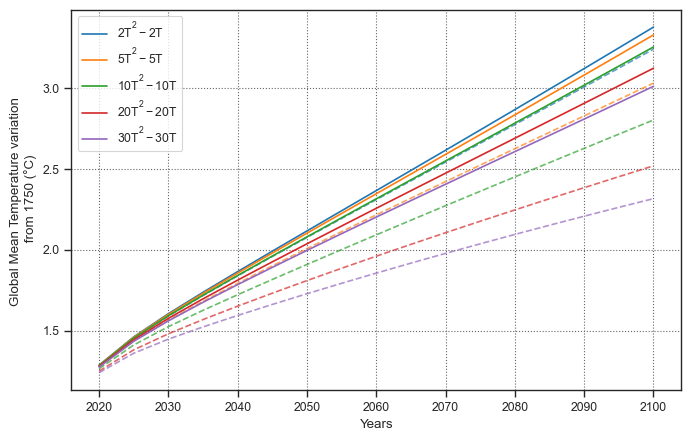

In [45]:
# puissance de la fonction damage 

alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,0,1.145])

list_damage_coef = [np.array([0,-30,30]), np.array([0,-20,20]), np.array([0,-10,10]), np.array([0,-5,5]), np.array([0,-2,2])]
list_damage_label = ['$30T^2 -30T$', '$20T^2-20T$', '$10T^2-10T$', '$5T^2-5T$', '$2T^2-2T$']

list_damage_coef.reverse()
list_damage_label.reverse()


# Création des joueurs 
list_sum_action = []
list_sum_utilities = []
list_temp = []
list_sum_action_so = []
list_sum_utilities_so = []
list_temp_so = []
for damage_coef in list_damage_coef :
    list_players = create_players(list_benefit_functions=BENEFITS_CONCAVE, damage_function=damage_polynome(damage_coef))


    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game_NE()
    game.repeated_one_shot_game_SO()

    list_sum_action.append(game.ne_sum_a_p)
    list_temp.append(game.ne_temp_p)
    list_sum_utilities.append(game.ne_sum_u_p)
    list_sum_action_so.append(game.so_sum_a_p)
    list_temp_so.append(game.so_temp_p)
    list_sum_utilities_so.append(game.so_sum_u_p)


plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_sum_action[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_sum_action_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)

plt.ylabel('Annual Global CO2 Emission (GtCO2)')
plt.xlabel('Years')
plt.legend()
plt.show()

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_sum_utilities[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_sum_utilities_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)

plt.ylabel('World Utility in Trillion $ 2011')
plt.xlabel('Years')
plt.legend()
plt.show()

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for idx, damage_coef in enumerate(list_damage_coef) :   
    p = plt.plot(2020 + np.arange(game.T)*5, list_temp[idx], label=list_damage_label[idx])
    plt.plot(2020 + np.arange(game.T)*5, list_temp_so[idx], color= p[0].get_color(), ls='--', alpha = 0.7)

plt.ylabel('Global Mean Temperature variation \n from 1750 (°C)')
plt.xlabel('Years')
plt.legend()
plt.show()
# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage


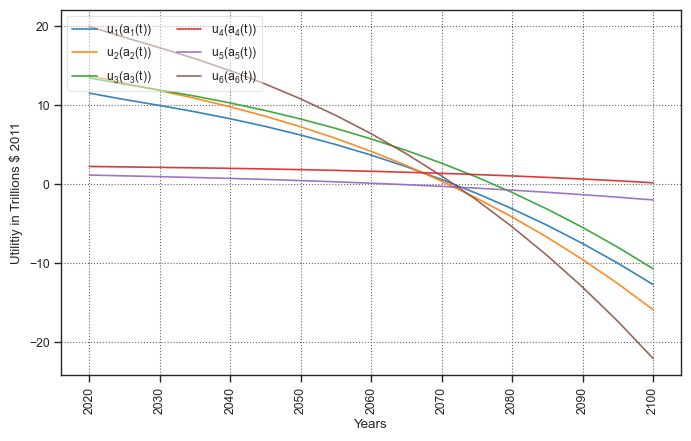

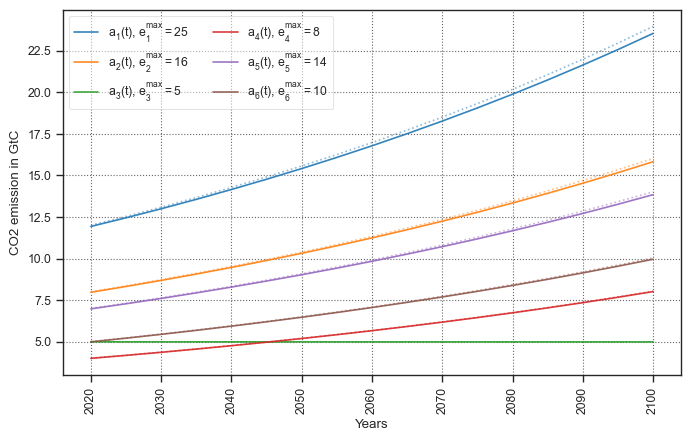

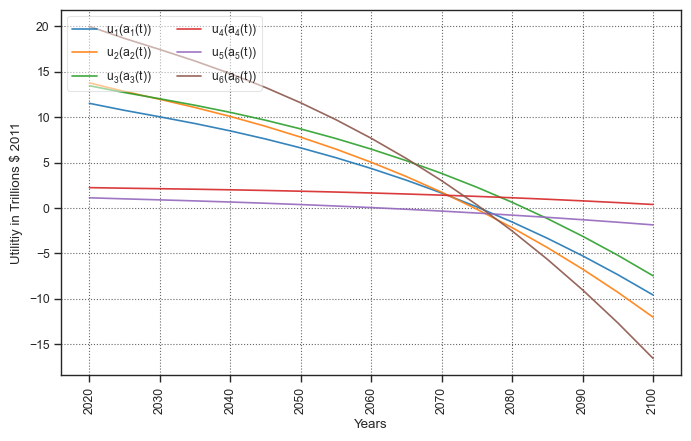

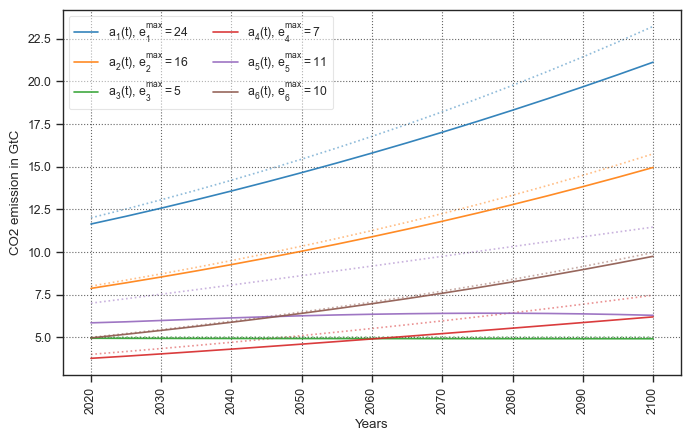

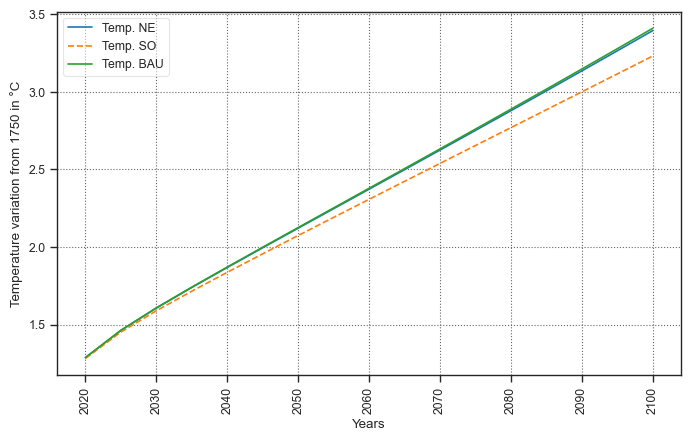

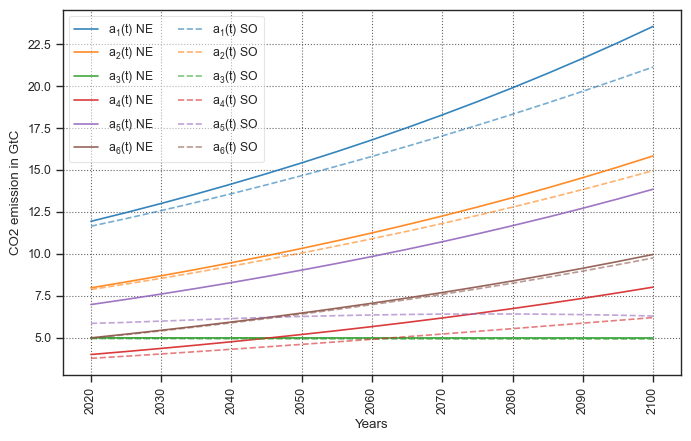

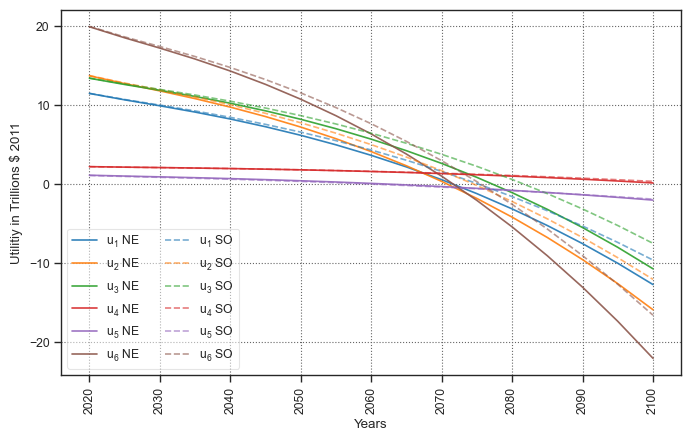

In [ ]:
# puissance de la fonction damage 

alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,0,10])

# Création des joueurs 

list_players = create_players(list_benefit_functions=BENEFITS_CONCAVE, damage_function=damage_polynome_percentage_GDP(damage_coef))



# Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

game = Game(list_players)

# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage

plot_Game(game, plot_nash=True, plot_SO=True,  plot_bau = True ,figsize=figsize, name='quadratic_10', sav=True)


## DICE damage function 

La fonction damage de DICE retourne uniquement des BAU, c'est surement dut au fait que ce n'est pas la même méthodologie, en effet, Nordaus fixe une temperature cible et donne un budget carbon pour atteindre cette temperature. La fonction "damage" permet de répartire de façon optimale les emissions de CO2 dans une trajectoire donnée. Donc la fonction damage dépende au prélable de la temperature cible et n'as pas de sens d'être utiliser pour la temperature on the fly comme dans les simulations. 

### Affine Benefit

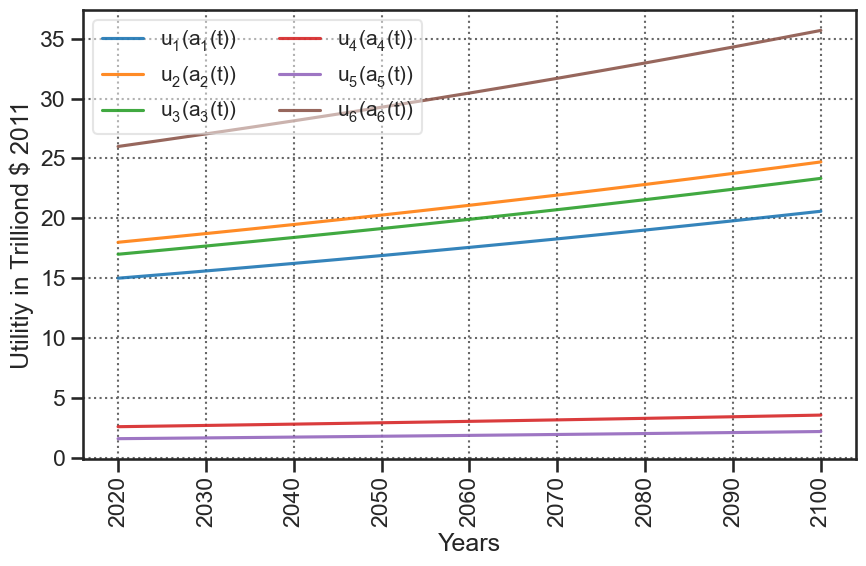

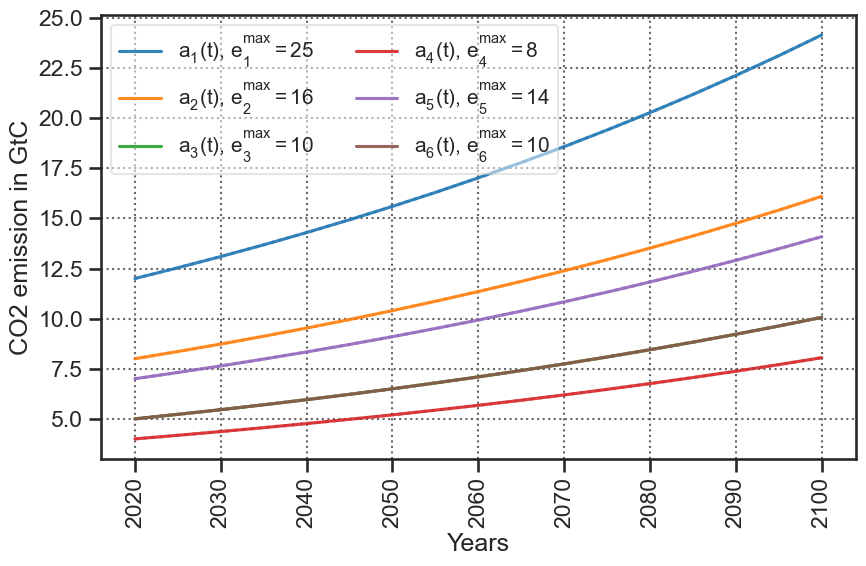

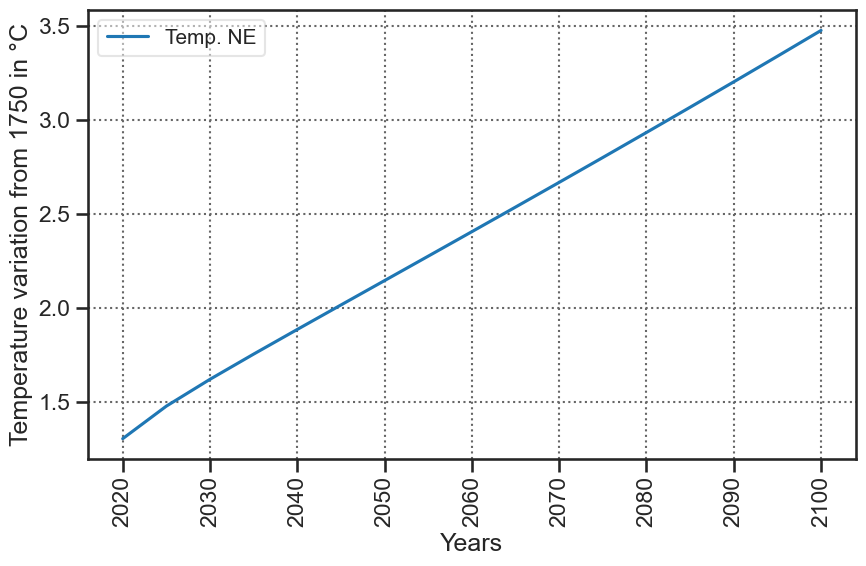

In [ ]:
alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,0,0.0022])*0

# Création des joueurs 

list_players = create_players(damage_function=damage_polynome(damage_coef))




# Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

game = Game(list_players)

# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage

plot_Game(game, plot_nash=True, plot_SO=False,  plot_bau = False ,figsize=figsize, name='affine_no_damage_beamer_seminar')

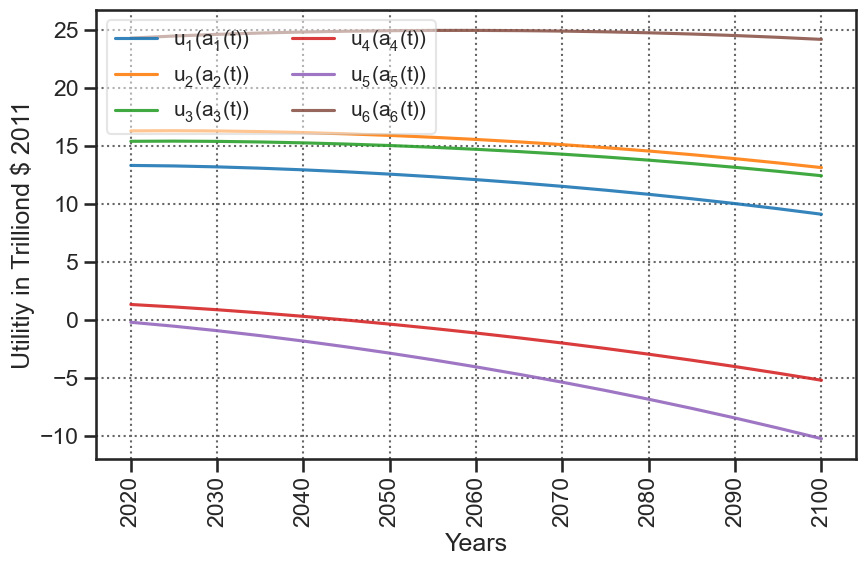

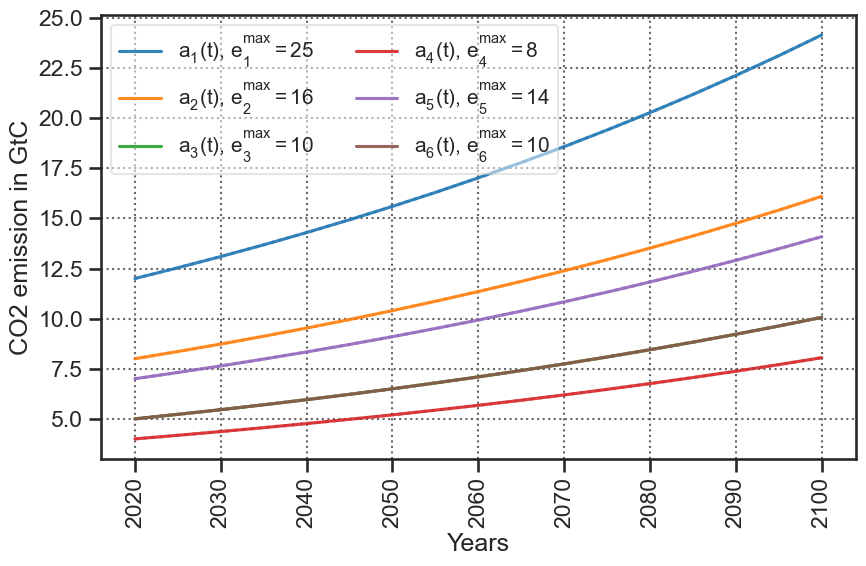

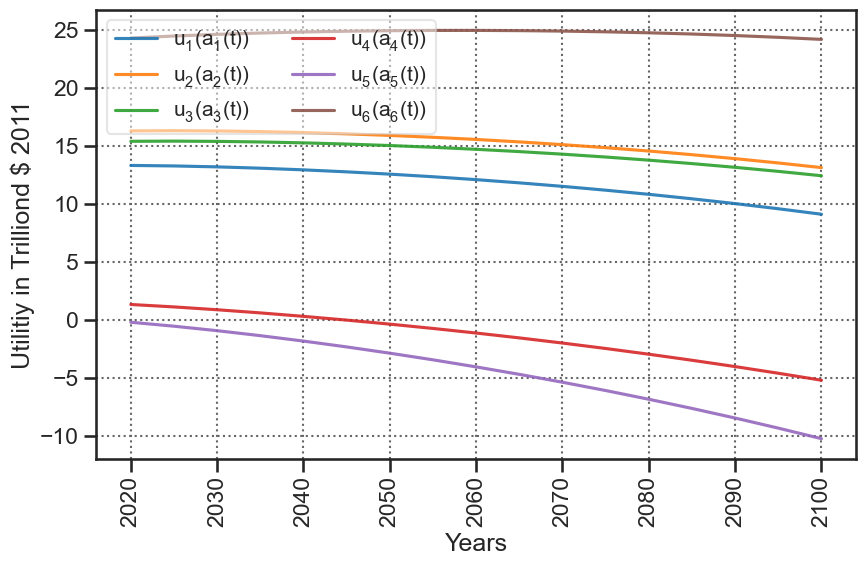

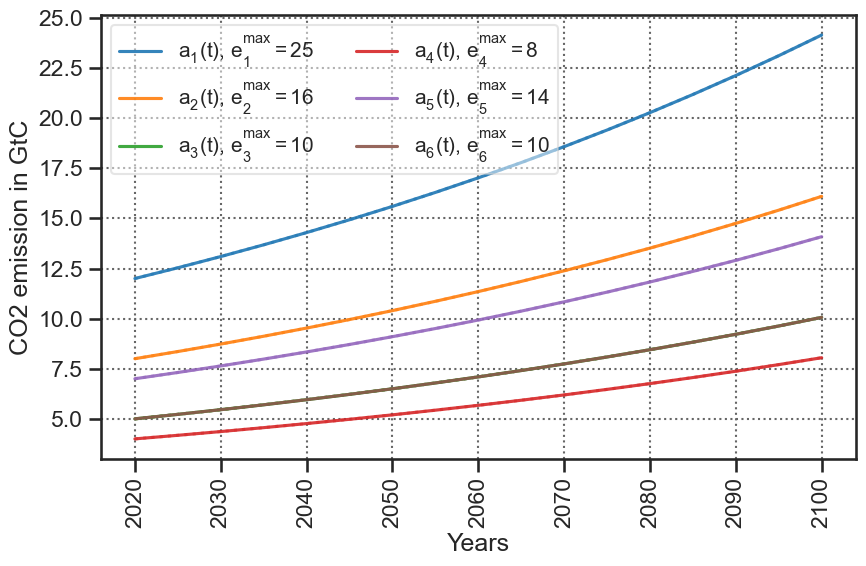

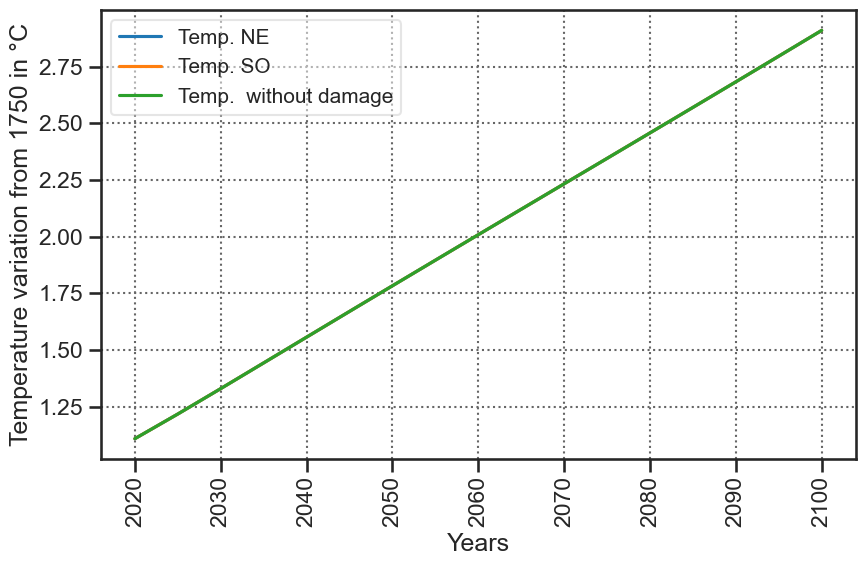

In [13]:
alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,0,1.145])

# Création des joueurs 

list_players = create_players(damage_function=damage_polynome(damage_coef))


# Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

game = Game(list_players)

# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage

plot_Game(game, plot_nash=True, plot_SO=True,  plot_bau = True ,figsize=figsize, name='affine_multiplicative_damage_beamer_seminar')

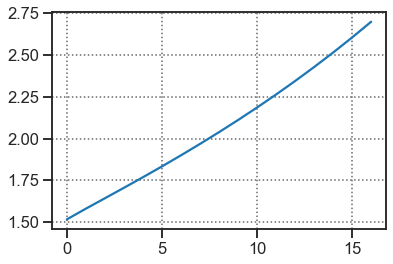

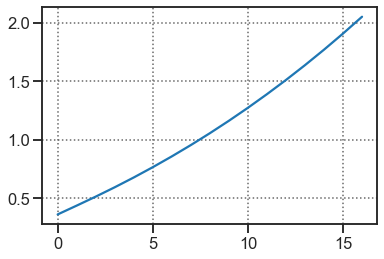

In [14]:
carbon = []
carbon_model = deepcopy(CARBON_MODEL)
game.repeated_one_shot_game_BAU()
for x in game.bau_sum_a_p:
    state = carbon_model.initial_state
    carbon.append(carbon_model.five_years_atmospheric_carbon(x,state)/CO2_AT_1750)
    carbon_model.initial_state = carbon_model.five_years_cycle(x, state)

plt.plot(carbon)
plt.show()
plt.plot(np.log2(carbon)**2)
plt.show()

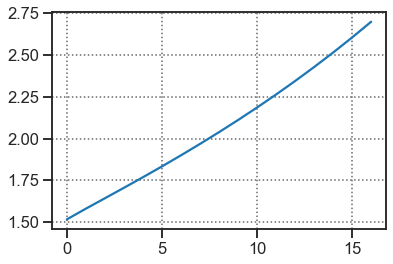

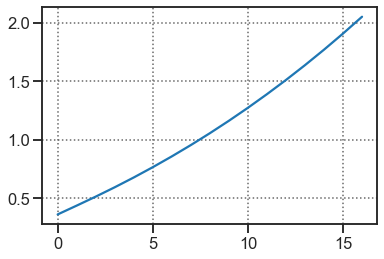

In [ ]:
carbon = []
carbon_model = deepcopy(CARBON_MODEL)
game.repeated_one_shot_game_BAU()
for x in game.bau_sum_a_p:
    state = carbon_model.initial_state
    carbon.append(carbon_model.five_years_atmospheric_carbon(x,state)/CO2_AT_1750)
    carbon_model.initial_state = carbon_model.five_years_cycle(x, state)

plt.plot(carbon)
plt.show()
plt.plot(np.log2(carbon)**2)
plt.show()

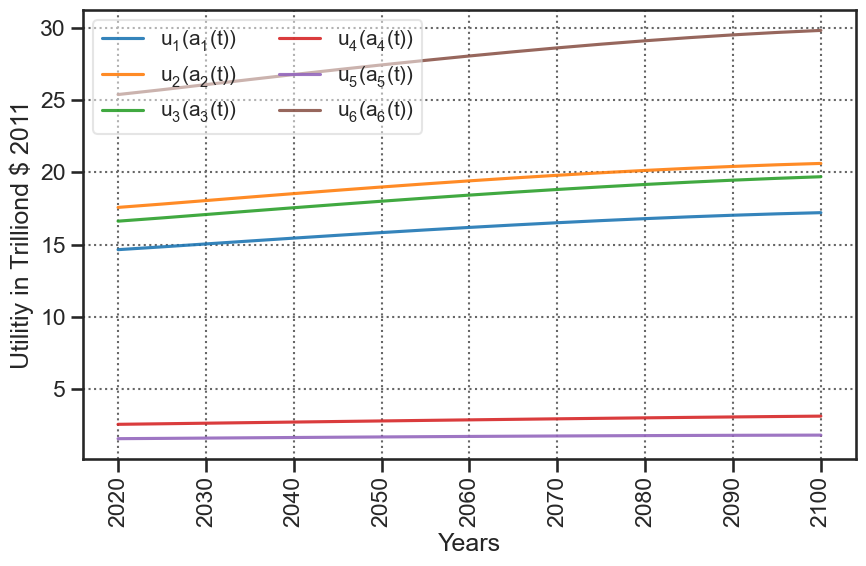

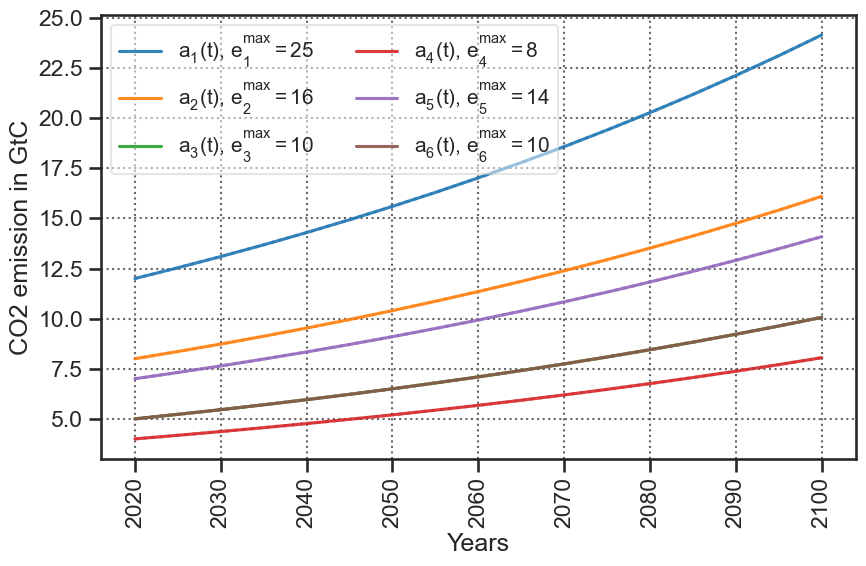

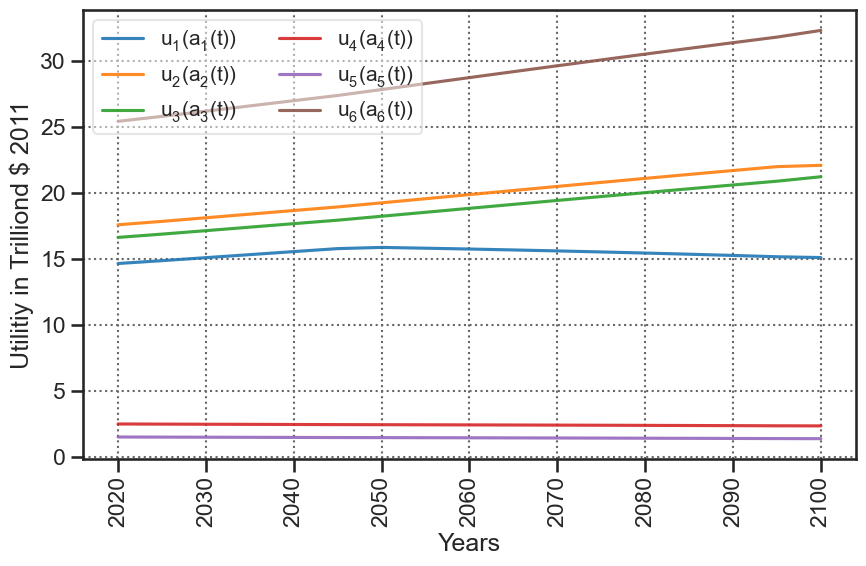

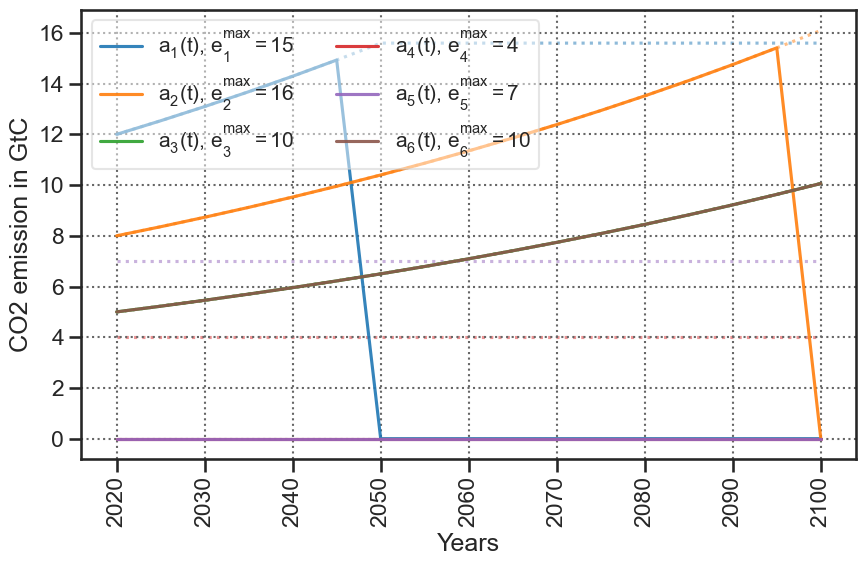

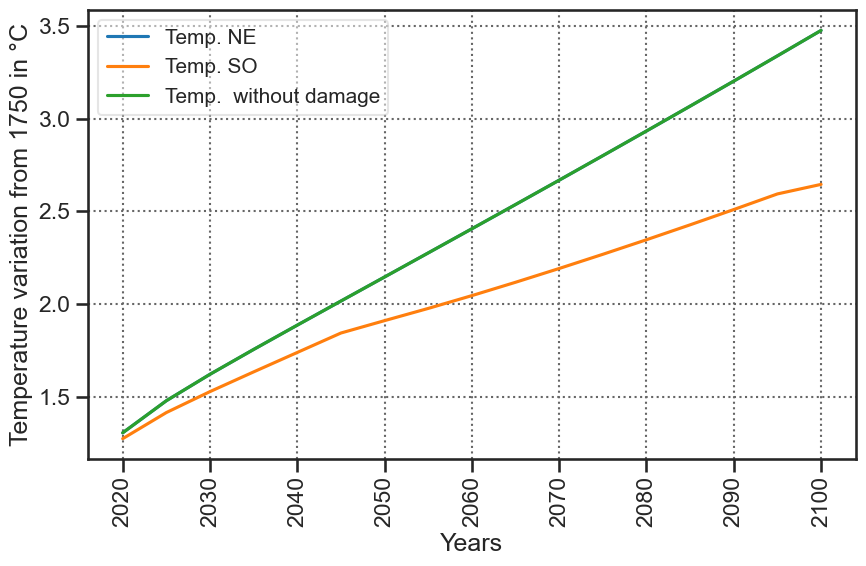

In [15]:
alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,0,1.145])

# Création des joueurs 
list_percentage_green = [0.990 for i in range(N)]


list_players = create_players(damage_function=damage_polynome_percentage_GDP(damage_coef), list_percentage_green=list_percentage_green)

# Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

game = Game(list_players)

# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage

plot_Game(game, plot_nash=True, plot_SO=True,  plot_bau = True ,figsize=figsize, name='affine_with_green_multiplicative_damage_beamer_seminar')

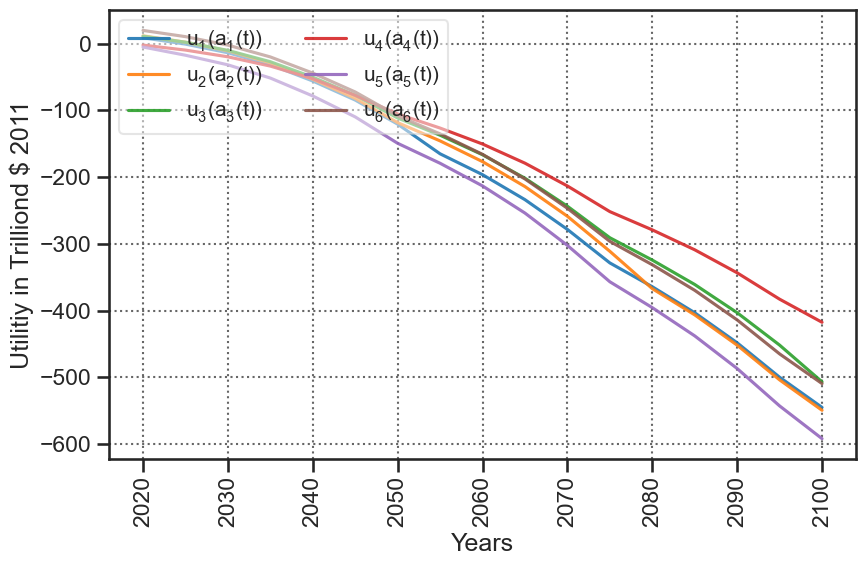

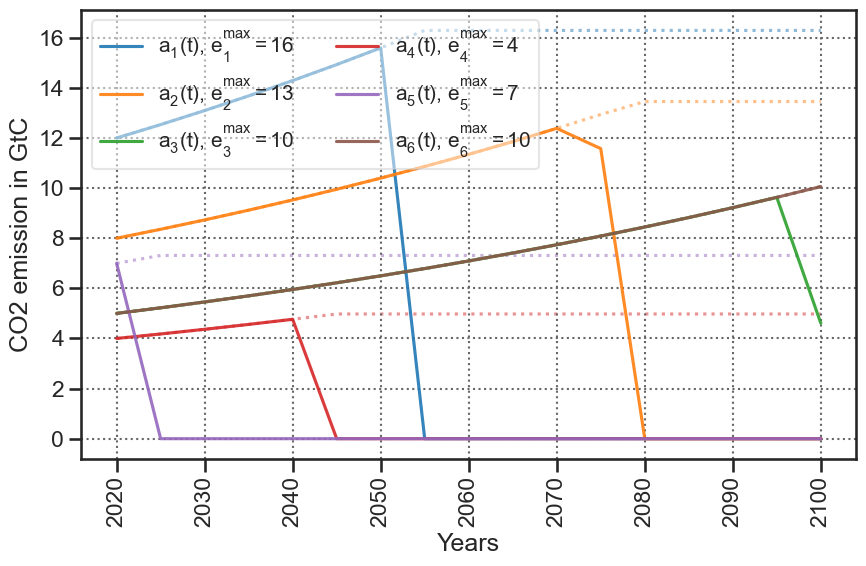

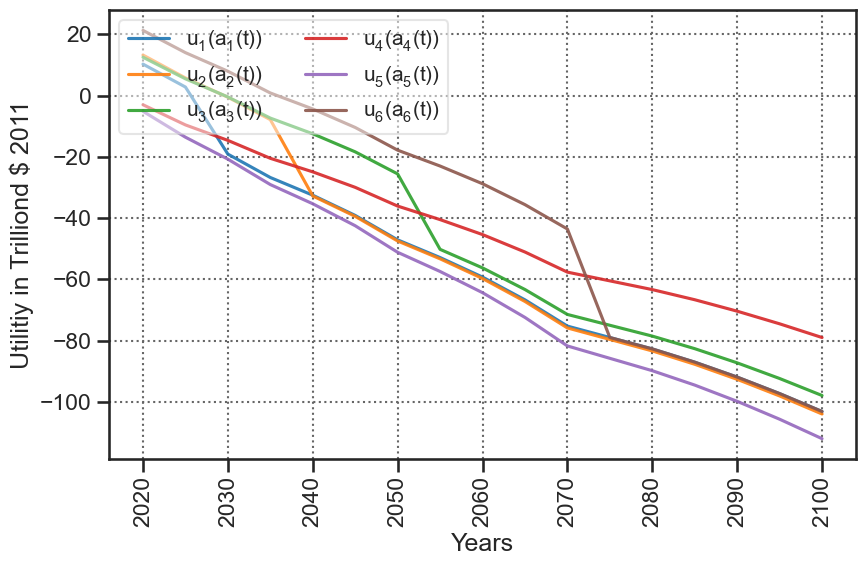

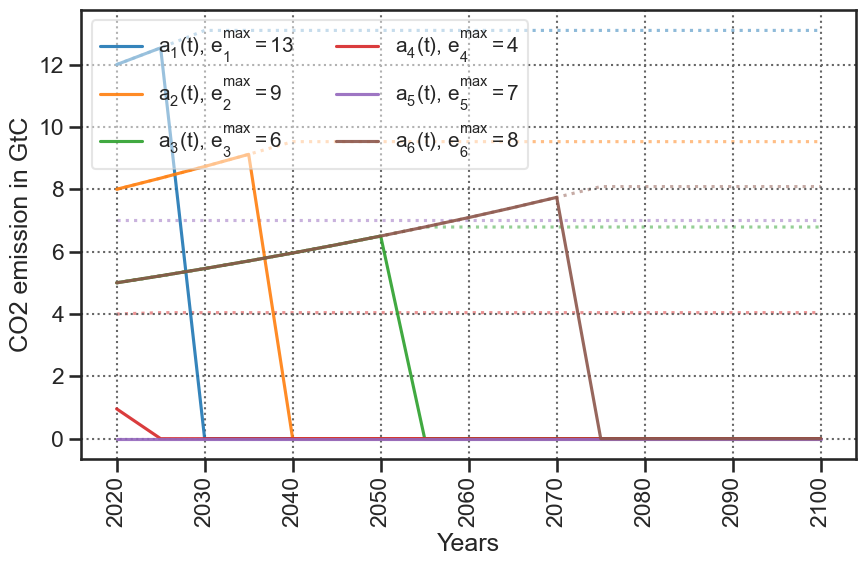

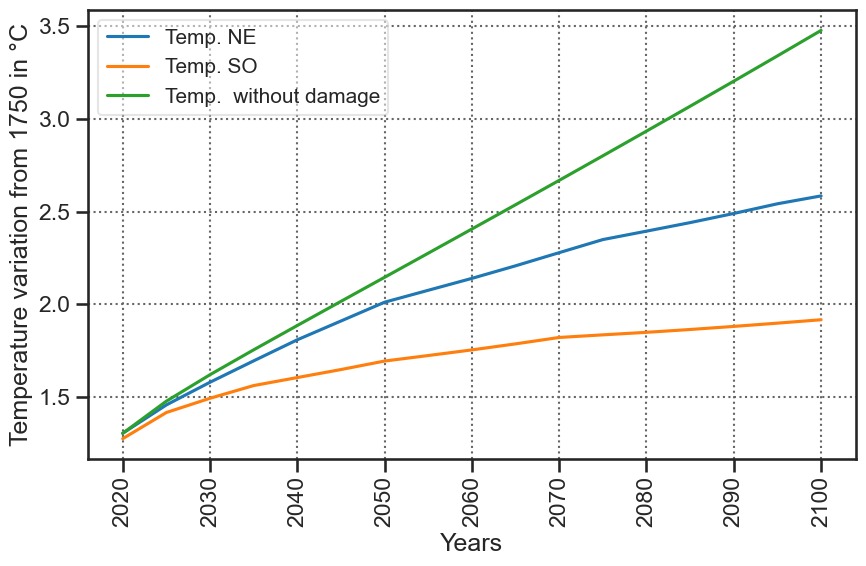

In [16]:
alpha =2

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,-5,5.145])

# Création des joueurs 



list_players = create_players(damage_function=damage_polynome(damage_coef), alpha=alpha)


# Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

game = Game(list_players)

# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage

plot_Game(game, plot_nash=True, plot_SO=True,  plot_bau = True ,figsize=figsize, name='affine_additive_damage_beamer_seminar')

### Quadratic benefit

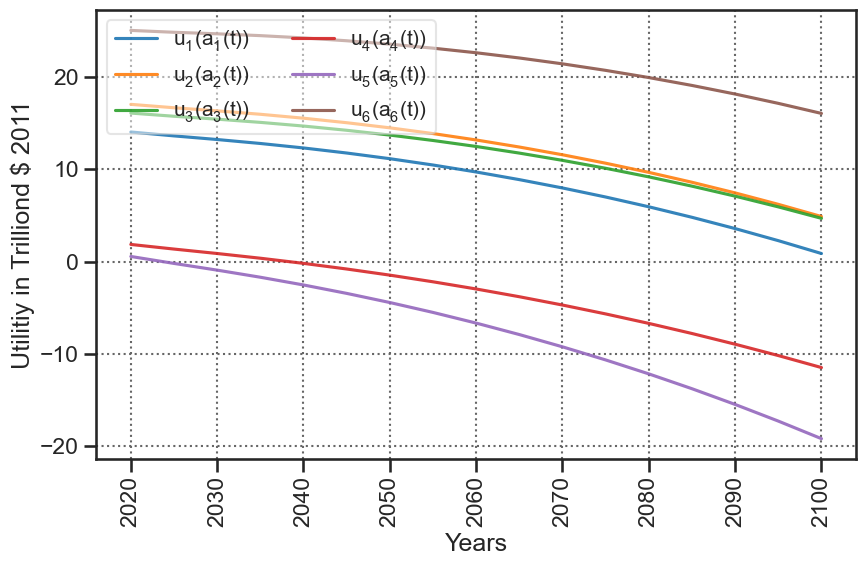

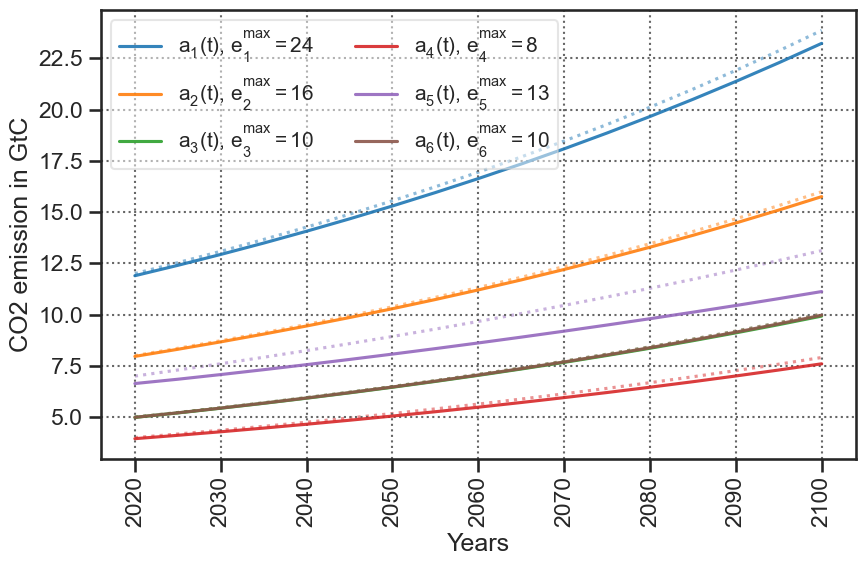

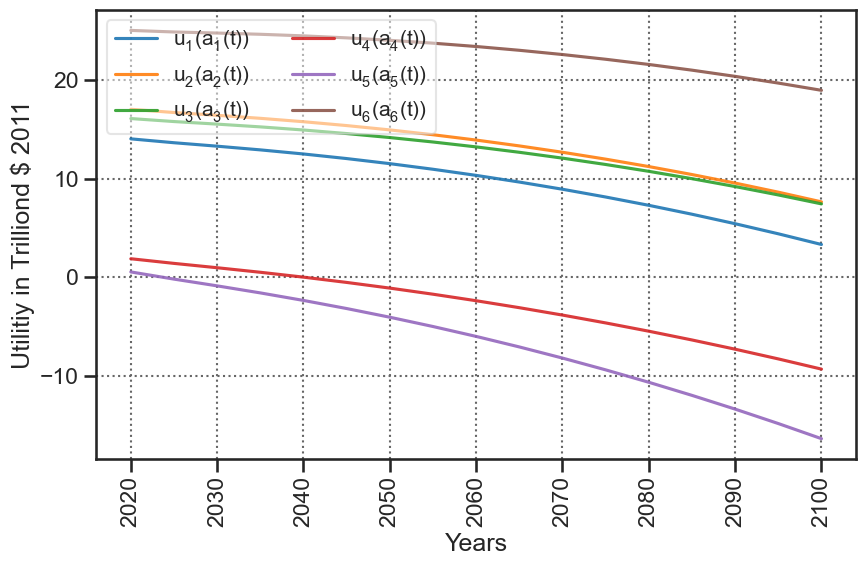

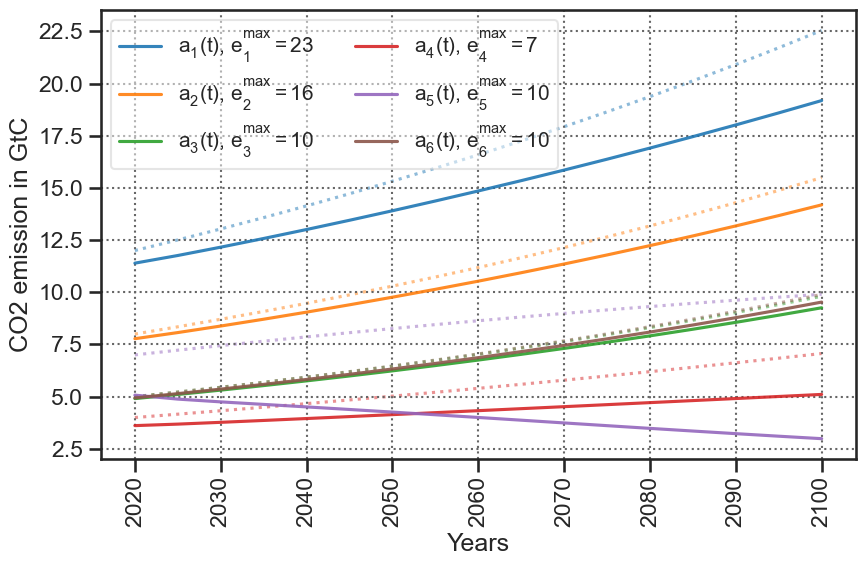

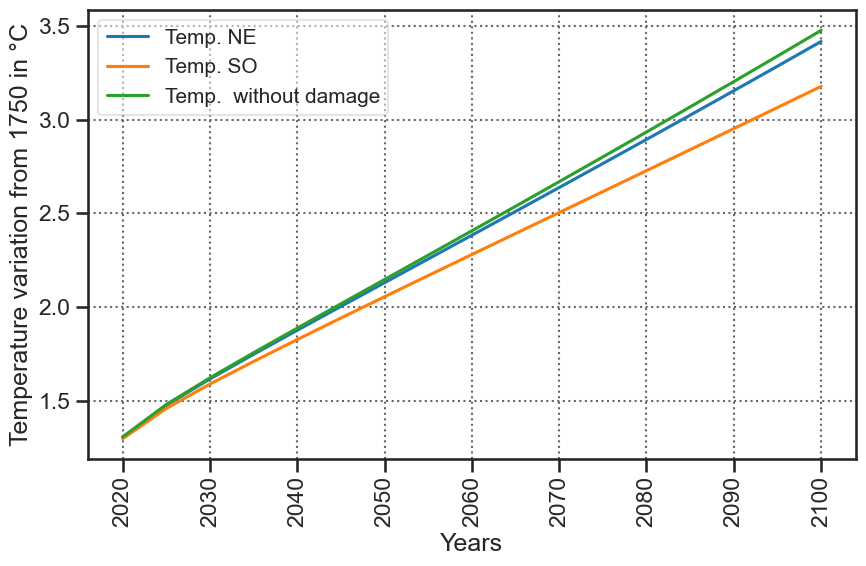

In [17]:

damage_coef = np.array([0,-5,7]) # shift

alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,-2,2])

# Création des joueurs 



list_players = create_players(list_benefit_functions=BENEFITS_CONCAVE,damage_function=damage_polynome(damage_coef), alpha=alpha, list_percentage_green=[.5 for i in range(N)])


# Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

game = Game(list_players)

# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage

plot_Game(game, plot_nash=True, plot_SO=True,  plot_bau = True ,figsize=figsize, name='concave_beamer_seminar')

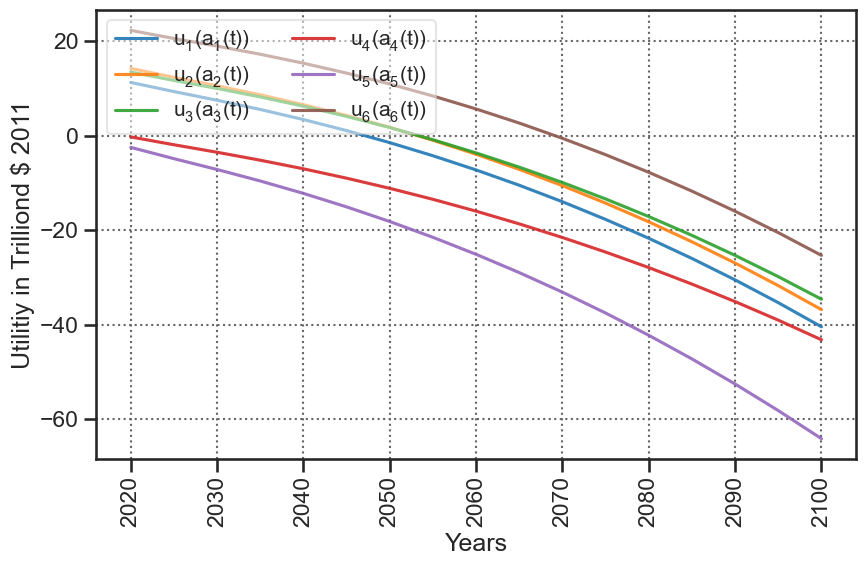

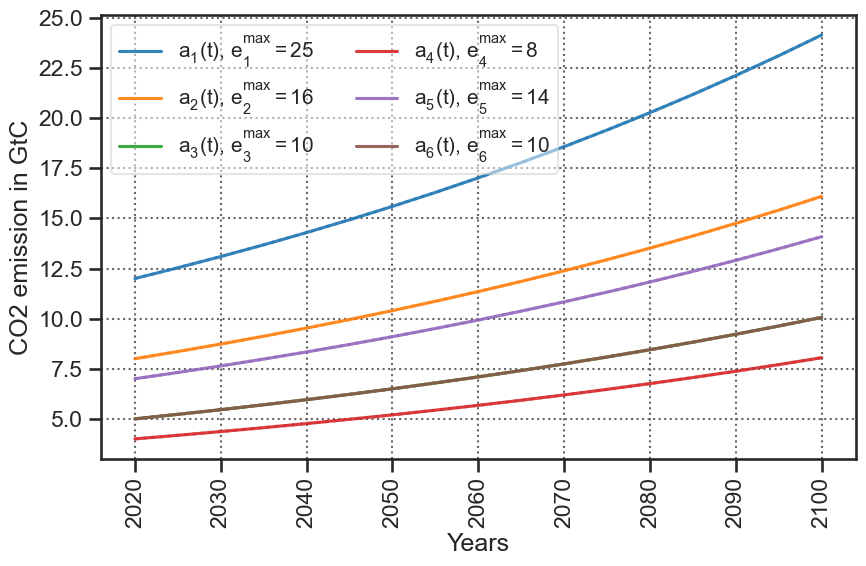

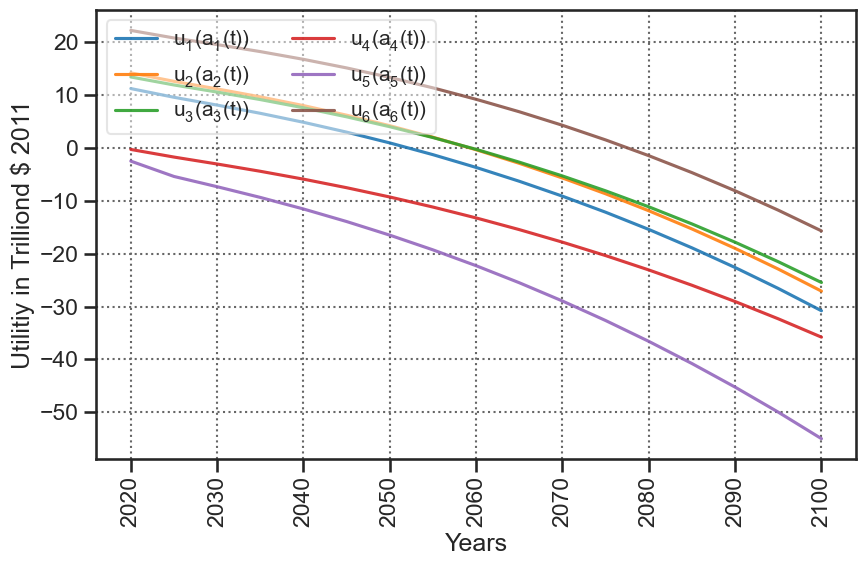

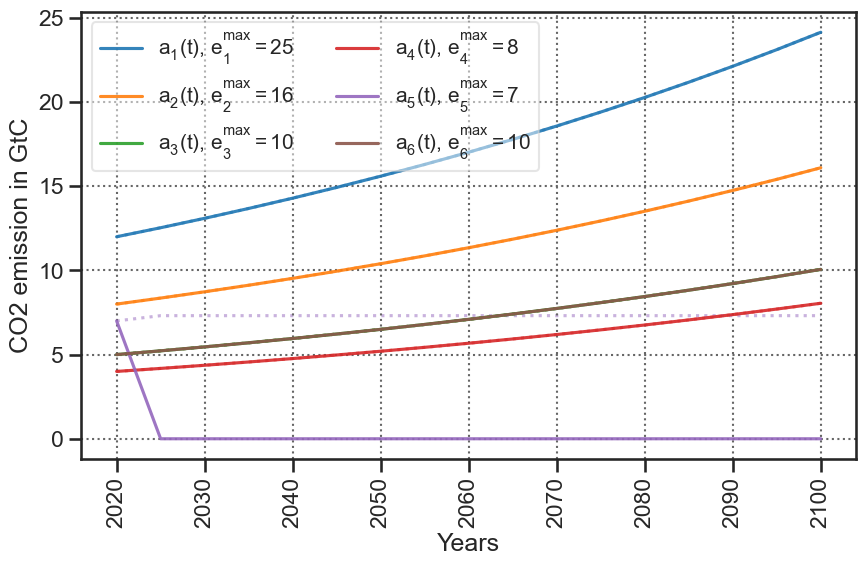

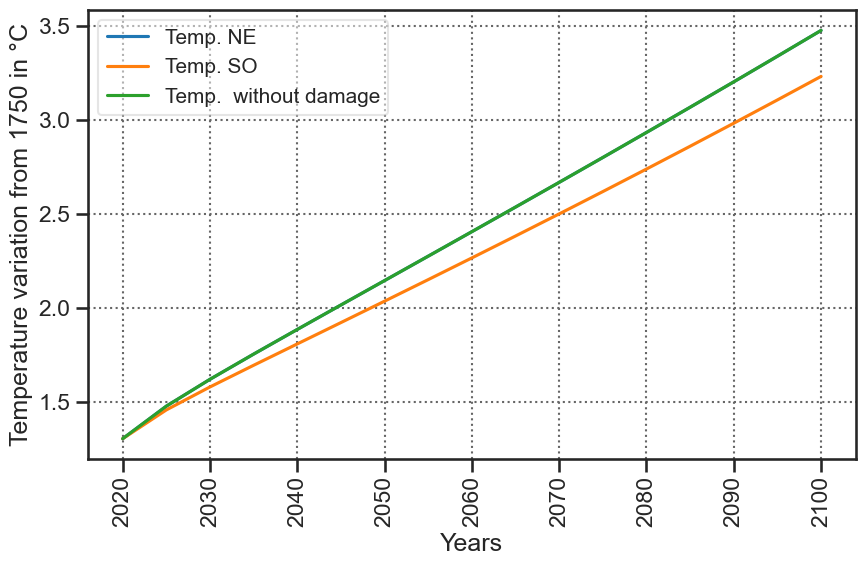

In [18]:

damage_coef = np.array([0,-5,7]) # shift

alpha =1

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,-5,5.7])

# Création des joueurs 


list_players = create_players(list_benefit_functions=BENEFITS_CONVEX,damage_function=damage_polynome(damage_coef), alpha=alpha, list_percentage_green=[.5 for i in range(N)])


# Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

game = Game(list_players)

# Plot du jeux -> le fonction plot est dans plot_function.py

# plot_nash= plot de la best response dynamic , plot_SO = plot les actions social optimales ,  plot_bau = plot les actions sans fonction damage

plot_Game(game, plot_nash=True, plot_SO=True,  plot_bau = True ,figsize=figsize, name='convex_beamer_seminar')

On va plot les actions du joueurs 1 au cours du temps dans différents configurations. 

# Fonction damage fixe


In [19]:

# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,-5,5.7])
damage_function = damage_polynome(damage_coef)

## alpha fixe

In [20]:
# puissance de la fonction damage 

alpha = 1


### Benefit function quadratic concave


In [21]:
list_percentage_green = np.arange(0,1.1,0.1)
list_action_player_1 = []

for percentage_green in list_percentage_green:
    # Création des joueurs 

    list_players = create_players(list_benefit_functions=BENEFITS_CONCAVE,damage_function=damage_function, alpha=alpha, list_percentage_green=[percentage_green for i in range(N)])


    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game_NE()
    list_action_player_1.append((game.ne_a_p[0], r"{:.0f}% GDP green".format(percentage_green*100)))



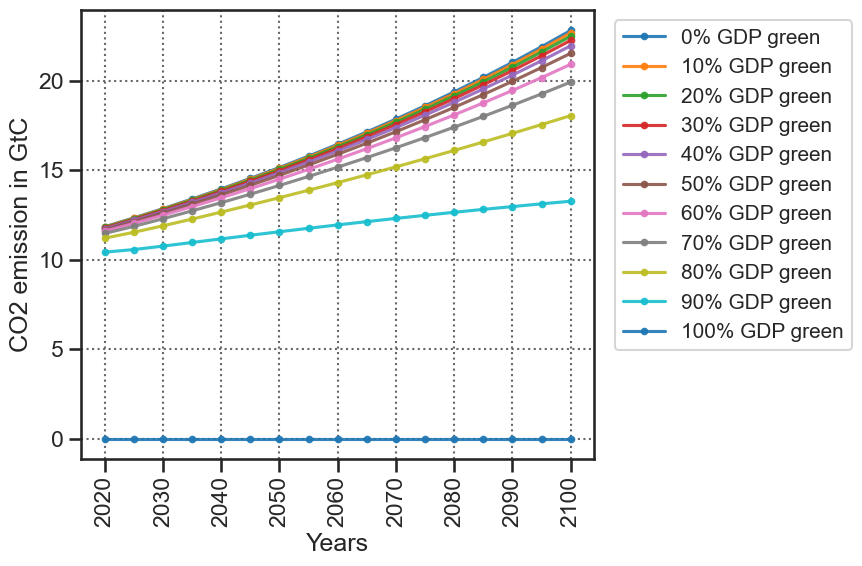

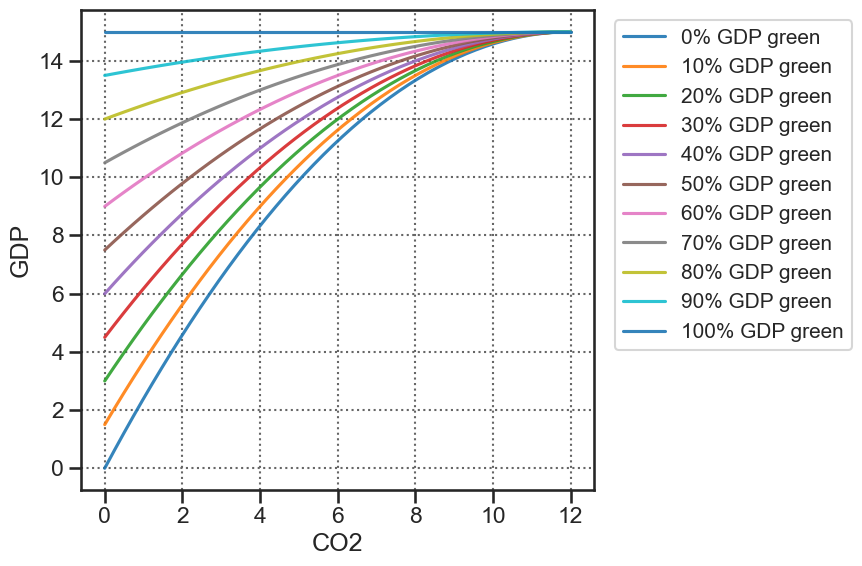

In [22]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


plt.show()

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

x = np.linspace(list_players[0].action_set[0], list_players[0].action_set[1])
for percentage in list_percentage_green:
    benef = benefit_quadratic_concave(list_players[0].GDP_max, list_players[0].action_set[1], percentage_green=percentage)
    p = plt.plot(x, benef(x), label=r"{:.0f}% GDP green".format(percentage*100), alpha = 0.9)


plt.ylabel('GDP')
plt.xlabel('CO2')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')

plt.show()



### Benefit function quadratic convexe


In [23]:
list_percentage_green = np.arange(.9,1.01,0.01)
list_action_player_1 = []

for percentage_green in list_percentage_green:
    # Création des joueurs 


    list_players = create_players(list_benefit_functions=BENEFITS_CONVEX, damage_function=damage_function, alpha=alpha, list_percentage_green=[percentage_green for i in range(N)])


    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.ne_a_p[0], r"{:.0f}% GDP green".format(percentage_green*100)))



TypeError: repeated_one_shot_game() missing 1 required positional argument: 'rule'

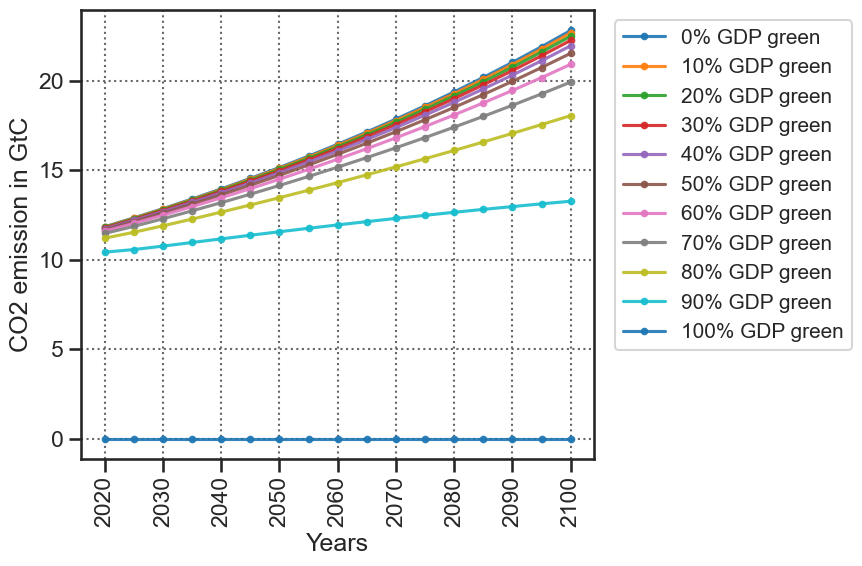

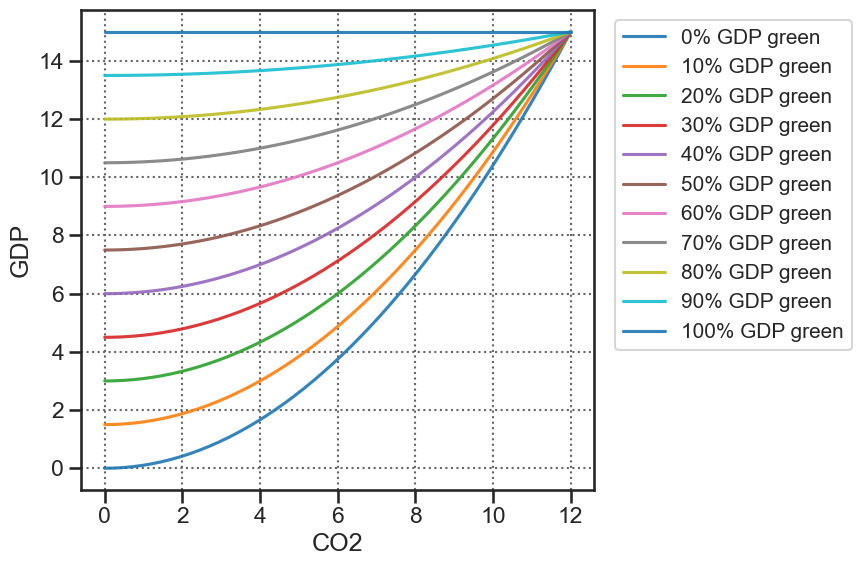

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

x = np.linspace(list_players[0].action_set[0], list_players[0].action_set[1])
for percentage in list_percentage_green:
    benef = benefit_quadratic_convex_with_percentage_green(list_players[0].GDP_max, list_players[0].action_set[1], percentage_green=percentage)
    p = plt.plot(x, benef(x), label=r"{:.0f}% GDP green".format(percentage*100), alpha = 0.9)


plt.ylabel('GDP')
plt.xlabel('CO2')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')

plt.show()




#### Benefit function sigmoid

In [36]:
from functools import partial

list_power = [ 0.001, 0.01, 0.1, 0.5, 0.8, 1, 2, 5, 10, 100, 1000]
list_action_player_1 = []
from models.game_theory.benefit_function import benefit_sigm

for power in list_power:
    # Création des joueurs 

    sigm = partial(benefit_sigm,power=power)
    list_benefit_functions=[sigm for i in range(N)]
    list_players = create_players(list_benefit_functions=list_benefit_functions, damage_function=damage_function, alpha=alpha)
                                

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game_NE()
    list_action_player_1.append((game.ne_a_p[0], r"power={}".format(power)))


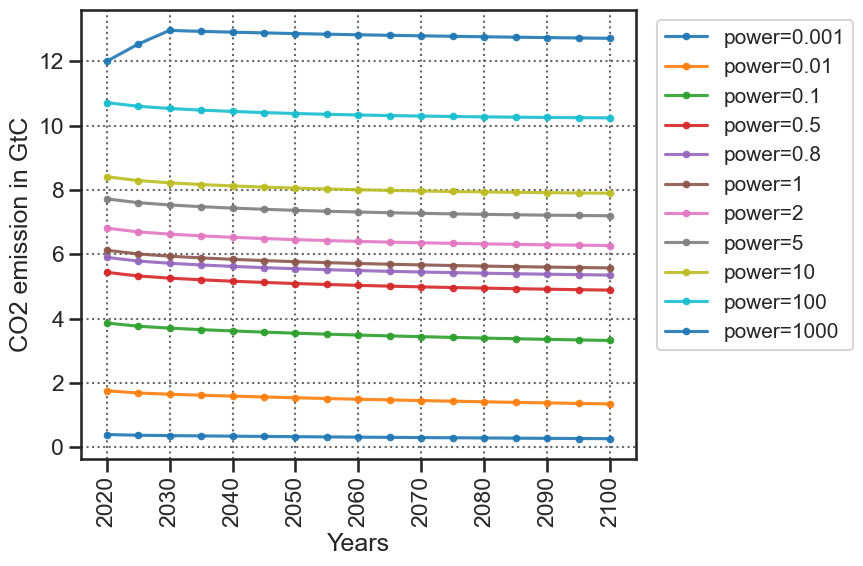

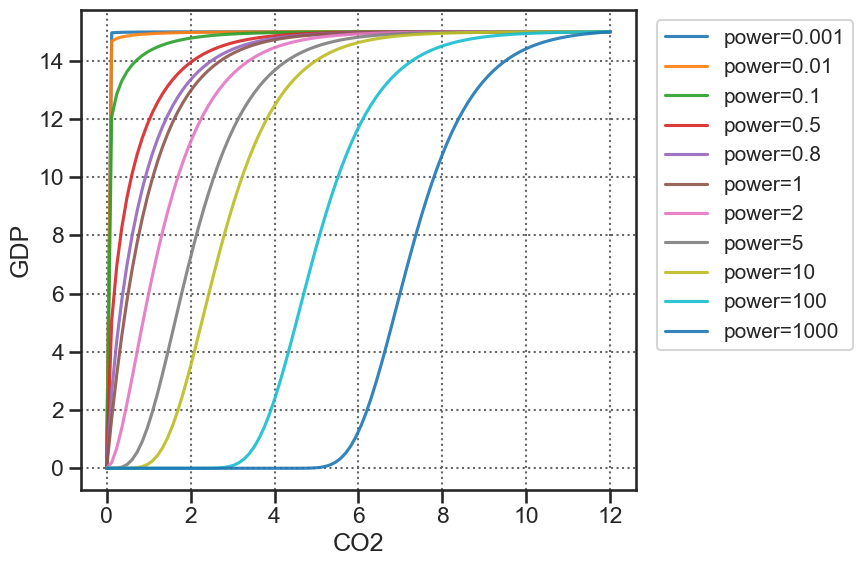

In [37]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

x = np.linspace(list_players[0].action_set[0], list_players[0].action_set[1],100)
for power in list_power:
    benef = benefit_sigm(list_players[0].GDP_max, list_players[0].action_set[1], power=power)
    p = plt.plot(x, benef(x), label=r"power={}".format(power), alpha = 0.9)


plt.ylabel('GDP')
plt.xlabel('CO2')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')

plt.show()

## benefice fixe

In [ ]:
# Coefficients de la fonction dammage (pour un polynome de degré 2)

benef_function = benefit_quadratic_concave_with_percentage_green(gdp_max[0], list_players[0].action_set[1], percentage_green=0.3)
list_benef_function = [benefit_quadratic_concave_with_percentage_green(gdp_max[i], action_sets[i][1], percentage_green=0.3) for i in range(N)]

In [ ]:
list_alpha = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 100]
list_action_player_1 = []

for alpha in list_alpha:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = ACTION_SETS[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_function,
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\alpha$ = {}".format(alpha)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()




# Benefice fixe CONCAVE

In [ ]:
# Coefficients de la fonction dammage (pour un polynome de degré 2)

benef_function = benefit_quadratic_concave_with_percentage_green(gdp_max[0], list_players[0].action_set[1], percentage_green=0.3)
list_benef_function = [benefit_quadratic_concave_with_percentage_green(gdp_max[i], ACTION_SETS[i,1], percentage_green=0.3) for i in range(N)]

### $\alpha = 1$ fixe

In [ ]:
alpha = 1

### Changement du coeff quadratic damage

In [ ]:
list_damage_coef_quadratic = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for quadratic_coef in list_damage_coef_quadratic:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = ACTION_SETS[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,0,quadratic_coef])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_2$ = {}".format(quadratic_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


### Changement du coeff linear damage

In [ ]:
list_damage_coef_linear = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for linear_coef in list_damage_coef_linear:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = ACTION_SETS[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,linear_coef,0])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_1$ = {}".format(linear_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


### Changement des coeff linear en négatif et quad damage

In [ ]:
list_damage_coef_linear = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for linear_coef in list_damage_coef_linear:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,-linear_coef,linear_coef])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_1$ = -{}, $\gamma_2$ = {}".format(linear_coef,linear_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


### $\alpha = 2$ fixe

In [ ]:
alpha = 2 

### Changement du coeff quadratic damage

In [ ]:
list_damage_coef_quadratic = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for quadratic_coef in list_damage_coef_quadratic:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,0,quadratic_coef])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_2$ = {}".format(quadratic_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


### Changement du coeff linear damage

In [ ]:
list_damage_coef_linear = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for linear_coef in list_damage_coef_linear:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,linear_coef,0])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_1$ = {}".format(linear_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


## Damage fixed

In [ ]:
# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,-5,5])
damage_function = damage_polynome(damage_coef)

### Variable $\alpha$

In [ ]:
list_alpha = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 100]
list_action_player_1 = []

for alpha in list_alpha:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_function,
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\alpha$ = {}".format(alpha)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()




# Benefice fixe CONVEXE

In [ ]:
# Coefficients de la fonction dammage (pour un polynome de degré 2)

benef_function = benefit_quadratic_convex_with_percentage_green(gdp_max[0], list_players[0].action_set[1], percentage_green=0.3)
list_benef_function = [benefit_quadratic_convex_with_percentage_green(gdp_max[i], action_sets[i,1], percentage_green=0.3) for i in range(N)]

### $\alpha = 1$ fixe

In [ ]:
alpha = 1

### Changement du coeff quadratic damage

In [ ]:
list_damage_coef_quadratic = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for quadratic_coef in list_damage_coef_quadratic:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,0,quadratic_coef])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_2$ = {}".format(quadratic_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


### Changement du coeff linear damage

In [ ]:
list_damage_coef_linear = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for linear_coef in list_damage_coef_linear:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,linear_coef,0])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_1$ = {}".format(linear_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


### Changement des coeff linear en négatif et quad damage

In [ ]:
list_damage_coef_linear = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for linear_coef in list_damage_coef_linear:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,-linear_coef,linear_coef])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_1$ = -{}, $\gamma_2$ = {}".format(linear_coef,linear_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


### $\alpha = 2$ fixe

In [ ]:
alpha = 2 

### Changement du coeff quadratic damage

In [ ]:
list_damage_coef_quadratic = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for quadratic_coef in list_damage_coef_quadratic:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,0,quadratic_coef])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_2$ = {}".format(quadratic_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


### Changement du coeff linear damage

In [ ]:
list_damage_coef_linear = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for linear_coef in list_damage_coef_linear:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,linear_coef,0])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_1$ = {}".format(linear_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()

### Changement des coeff linear en négatif et quad damage

In [ ]:
list_damage_coef_linear = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for linear_coef in list_damage_coef_linear:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,-linear_coef,linear_coef])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_1$ = -{}, $\gamma_2$ = {}".format(linear_coef,linear_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


## Damage fixed

In [ ]:
# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,-5,5])
damage_function = damage_polynome(damage_coef)

### Variable $\alpha$

In [ ]:
list_alpha = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 100]
list_action_player_1 = []

for alpha in list_alpha:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_function,
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\alpha$ = {}".format(alpha)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()

# Benefice fixe SIGMOID

In [ ]:
# Coefficients de la fonction dammage (pour un polynome de degré 2)

benef_function = benefice_sigm(gdp_max[0], list_players[0].action_set[1], power = 10)
list_benef_function = [benefice_sigm(gdp_max[i], action_sets[i,1], power = 10) for i in range(N)]

### $\alpha = 1$ fixe

In [ ]:
alpha = 1

### Changement du coeff quadratic damage

In [ ]:
list_damage_coef_quadratic = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for quadratic_coef in list_damage_coef_quadratic:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,0,quadratic_coef])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_2$ = {}".format(quadratic_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


### Changement du coeff linear damage

In [ ]:
list_damage_coef_linear = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for linear_coef in list_damage_coef_linear:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,linear_coef,0])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_1$ = {}".format(linear_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


### Changement des coeff linear en négatif et quad damage

In [ ]:
list_damage_coef_linear = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for linear_coef in list_damage_coef_linear:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,-linear_coef,linear_coef])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_1$ = -{}, $\gamma_2$ = {}".format(linear_coef,linear_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


### $\alpha = 2$ fixe

In [ ]:
alpha = 2 

### Changement du coeff quadratic damage

In [ ]:
list_damage_coef_quadratic = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for quadratic_coef in list_damage_coef_quadratic:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,0,quadratic_coef])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_2$ = {}".format(quadratic_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


### Changement du coeff linear damage

In [ ]:
list_damage_coef_linear = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for linear_coef in list_damage_coef_linear:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,linear_coef,0])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_1$ = {}".format(linear_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()

### Changement des coeff linear en négatif et quad damage

In [ ]:
list_damage_coef_linear = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 20, 50, 100, 150, 300]
list_action_player_1 = []

for linear_coef in list_damage_coef_linear:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_polynome(np.array([0,-linear_coef,linear_coef])),
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\gamma_1$ = -{}, $\gamma_2$ = {}".format(linear_coef,linear_coef)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()


## Damage fixed

In [ ]:
# Coefficients de la fonction dammage (pour un polynome de degré 2)

damage_coef = np.array([0,-5,5])
damage_function = damage_polynome(damage_coef)

### Variable $\alpha$

In [ ]:
list_alpha = [0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10, 100]
list_action_player_1 = []

for alpha in list_alpha:
    # Création des joueurs 

    list_players = [player_class(name = 'player {}'.format(i), action_set = action_sets[i], smc = deepcopy(smc),
                                    benefit_function = list_benef_function[i],
                                    damage_function = damage_function,
                                    impact_factor_of_temperature = deltas[i],
                                    alpha=alpha) for i in range(N)]

    # Création du jeux, les parametres du jeux comme les emission exo, la durée du jeux les trucs geophysiques, ... sont dans le fichier parameters.py

    game = Game(list_players)
    game.repeated_one_shot_game()
    list_action_player_1.append((game.action_profiles[0], r"$\alpha$ = {}".format(alpha)))

In [ ]:
n,tmax = N, game.T

plt.figure(figsize=figsize, dpi=100, tight_layout=True)

for item in list_action_player_1:
    action_player_1, label = item
    p = plt.plot(2020 + np.arange(tmax)*5, action_player_1, label=label, marker=".", alpha = 0.9)


plt.ylabel('CO2 emission in GtC')
plt.xlabel('Years')

# plt.title('Players\' actions with respect to the state')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(2020 + np.arange(int(tmax//2)+1)*10, 2020 + np.arange(int(tmax//2)+1)*10, rotation=90)

plt.show()